In [9]:
import flopy
import numpy as np
from skimage.draw import polygon

In [10]:
modelname = 'flopy_ex_tao_2'
mf = flopy.modflow.Modflow(modelname, exe_name='C:/Users/hsianghao/Desktop/tao/mf2005.exe')


#DIS file
Lx = 45000
Ly = 35000
ztop = 10.0
zbot = -50.0
nlay = 1                                #number of layers
nrow = 70                              #number of rows
ncol = 90                              #number of columns
delr = Lx/ncol                          #cell width along rows
delc = Ly/nrow                          #cell width along columns
delv = (ztop - zbot) / nlay             #cell width along layers
botm = np.linspace(ztop, zbot, nlay+1)  #bottom elevation of a model layer or a Quasi-3d confining bed

x=100
nper = 1+x      # the number of stress periods in the simulation
nstp = [1]+[1]*x      # the number of time steps in a stress period.
perlen = [1]+[10]*x   # the length of a stress period
steady = [True]+[False]*x
itumni = 4       #itumni: indicates the time unit of model data (0:undefined, 1:seconds, 2:minutes, 3:hours, 4:days, 5:years)
lenuni = 2       #lenuni: indicates the length unit of model data (0:undefined, 1:feet, 2:meters, 3:centimeters)

dis = flopy.modflow.ModflowDis(
    mf, nlay, nrow, ncol, delr=delr, delc=delc, top=ztop, botm=botm[1:],
    nper=nper, nstp=nstp, perlen=perlen, itmuni=itumni, steady=steady)


In [11]:
#BAS file
ibound = np.zeros((nrow, ncol), dtype=np.int32)   #boundary variable
vertices = np.array([[29,1],[31,11],[25,15],[20,14],[15,35],[7,34],[1,44],[26,71],[37,68],[39,77],[43,85],[46,83],[48,88],[52,83],
                     [54,85],[56,80],[57,74],[60,70],[63,62],[66,60],[68,56],[62,40],[59,35],[58,30],[56,26],[52,19],[50,14],
                     [42,6],[36,5],[31,2]
                    ])
rr,cc = polygon(vertices[:,0], vertices[:,1], ibound.shape)
ibound[rr,cc] = 1

const_head_v = np.array([[68,56],[62,40],[59,35],[58,30],[56,26],[52,19],[50,14],[42,6],[36,5],[31,2],
                         [31,3],[36,6],[42,7],[50,16],[52,21],[56,27],[58,34],[59,37],[62,43],[68,58]
                        ])
rr,cc = polygon(const_head_v[:,0], const_head_v[:,1], ibound.shape)
ibound[rr,cc] = -1

const_head_v2 = np.array([[1,44],[14,57],[14,58],[1,45]])
rr,cc = polygon(const_head_v2[:,0], const_head_v2[:,1], ibound.shape)
ibound[rr,cc] = -1

ibound2=np.array([ibound])


#initial head at the beginning of the simulation
strt = np.zeros((nrow, ncol), dtype=np.float32)   

rr,cc = polygon(const_head_v2[:,0], const_head_v2[:,1], ibound.shape)
strt[rr,cc] = 75
    
strt=np.array([strt])    
    
bas = flopy.modflow.ModflowBas(mf, ibound=ibound2, strt=strt)


In [12]:
#Layer Property Flow Package
lpf = flopy.modflow.ModflowLpf(mf, laytyp=1, hk=2.4, vka=0.1 ,sy=0.1, ss=0.01)   
#hk: hydraulic conductivity, vka: vertical hk

#Well
#stress period:[ layer, row, column, Q(m^3/hour)]
Q=-216*10*24
Q2=0
stress_period_data = {1:[[0,18,50,Q],[0,33,31,Q],[0,15,42,Q],[0,25,55,Q],[0,19,59,Q],
                         [0,9,42,Q],[0,19,33,Q],[0,25,36,Q],[0,29,65,Q],[0,13,48,Q],
                         [0,24,41,Q],[0,22,47,Q],[0,30,22,Q],[0,36,57,Q],[0,10,39,Q],
                         [0,5,45,Q],[0,38,38,Q],[0,22,25,Q],[0,43,61,Q],[0,31,43,Q],
                        ],
                      10:[[0,18,50,Q2],[0,33,31,Q2],[0,15,42,Q2],[0,25,55,Q2],[0,19,59,Q2],
                         [0,9,42,Q2],[0,19,33,Q2],[0,25,36,Q2],[0,29,65,Q2],[0,13,48,Q2],
                         [0,24,41,Q2],[0,22,47,Q2],[0,30,22,Q2],[0,36,57,Q2],[0,10,39,Q2],
                         [0,5,45,Q2],[0,38,38,Q2],[0,22,25,Q2],[0,43,61,Q2],[0,31,43,Q2],
                        ]}
rech={}
rech[0]=0.000024
rech[1]=0.000024
#rech[10]=0.000004

wel = flopy.modflow.ModflowWel(mf, stress_period_data=stress_period_data)
#rch = flopy.modflow.ModflowRch(mf, rech=rech)


#Output Control
stress_period_data = {}
for kper in range(nper):
    for kstp in range(nstp[kper]):
        stress_period_data[(kper, kstp)] = [
            "save head",
            "save drawdown",
            "save budget",
            "print head",
            "print budget",
        ]
oc = flopy.modflow.ModflowOc(
    mf, stress_period_data=stress_period_data
)


#Preconditioned Conjugate-Gradient Solver
gmg = flopy.modflow.ModflowGmg(mf)


# Write the model input files
mf.write_input()
# Run the model
success, buff = mf.run_model(silent=False)
if not success:
    raise Exception("MODFLOW did not terminate normally.")

FloPy is using the following executable to run the model: C:/Users/hsianghao/Desktop/tao/mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.12.00 2/3/2017                        

 Using NAME file: flopy_ex_tao_2.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2023/07/28  1:01:49

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     2    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     3    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     4    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     5    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     6    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     7    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     8    Tim

In [14]:
import flopy.utils.binaryfile as bf
hds = bf.HeadFile(modelname+'.hds')
times = hds.get_times()
for i in times:
    for j in range(1):
        head = hds.get_data(totim=i)
        Z = head[j,:,:]
        Z = np.where(Z <= -999.99, np.nan, Z)
        print(i,'   ',Z[43,61],'  ', np.nanmin(Z),'  ', np.nanmax(Z),'  ', np.nanmean(Z,dtype=np.float32),'  ')


1.0     22.92168    0.0    75.0    23.707222   
11.0     19.592342    0.0    75.0    23.68479   
21.0     16.38393    0.0    75.0    23.662355   
31.0     13.290992    -2.971186    75.0    23.636414   
41.0     10.308349    -18.140411    75.0    23.604858   
51.0     -3.648369    -33.972958    75.0    23.564955   
61.0     -17.945498    -30.192957    75.0    23.546467   
71.0     -33.104717    -47.00063    75.0    23.528048   
81.0     nan    -40.9979    75.0    23.538197   
91.0     nan    -25.566643    75.0    23.53086   
101.0     nan    -18.228281    75.0    23.537264   
111.0     nan    -11.218542    75.0    23.542519   
121.0     nan    -4.853327    75.0    23.54713   
131.0     nan    0.0    75.0    23.550087   
141.0     nan    0.0    75.0    23.552288   
151.0     nan    0.0    75.0    23.553375   
161.0     nan    0.0    75.0    23.553516   
171.0     nan    0.0    75.0    23.553522   
181.0     nan    0.0    75.0    23.553524   
191.0     nan    0.0    75.0    23.55353   
20

[1.0, 11.0, 21.0, 31.0, 41.0, 51.0, 61.0, 71.0, 81.0, 91.0, 101.0, 111.0, 121.0, 131.0, 141.0, 151.0, 161.0, 171.0, 181.0, 191.0, 201.0, 211.0, 221.0, 231.0, 241.0, 251.0, 261.0, 271.0, 281.0, 291.0, 301.0, 311.0, 321.0, 331.0, 341.0, 351.0, 361.0, 371.0, 381.0, 391.0, 401.0, 411.0, 421.0, 431.0, 441.0, 451.0, 461.0, 471.0, 481.0, 491.0, 501.0, 511.0, 521.0, 531.0, 541.0, 551.0, 561.0, 571.0, 581.0, 591.0, 601.0, 611.0, 621.0, 631.0, 641.0, 651.0, 661.0, 671.0, 681.0, 691.0, 701.0, 711.0, 721.0, 731.0, 741.0, 751.0, 761.0, 771.0, 781.0, 791.0, 801.0, 811.0, 821.0, 831.0, 841.0, 851.0, 861.0, 871.0, 881.0, 891.0, 901.0, 911.0, 921.0, 931.0, 941.0, 951.0, 961.0, 971.0, 981.0, 991.0, 1001.0]
1.0


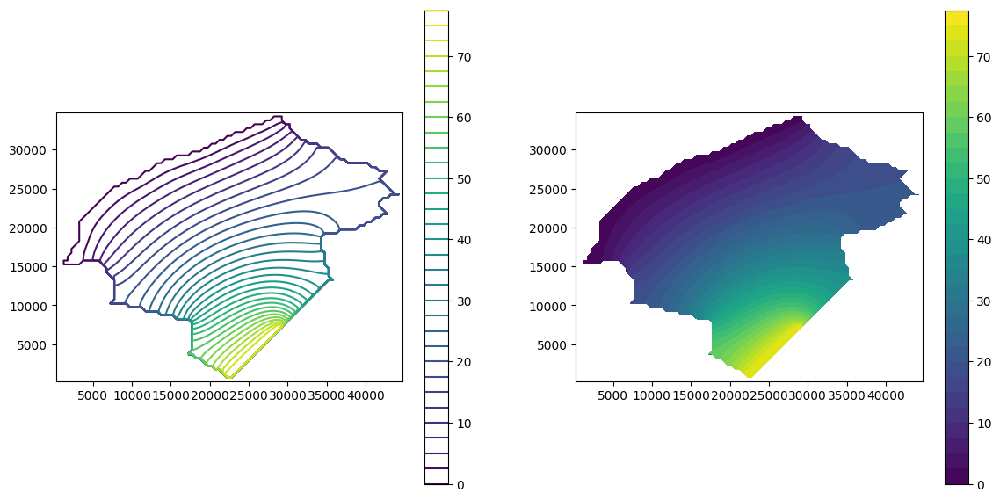

11.0


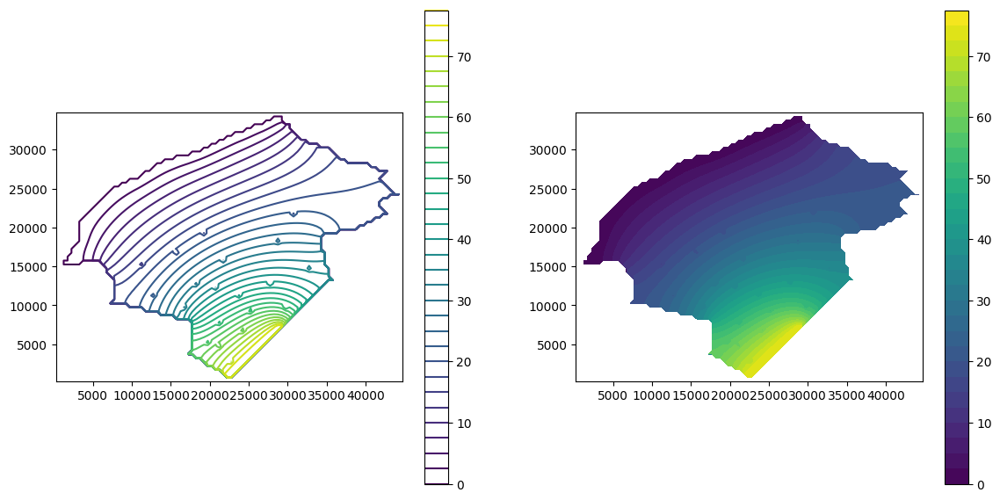

21.0


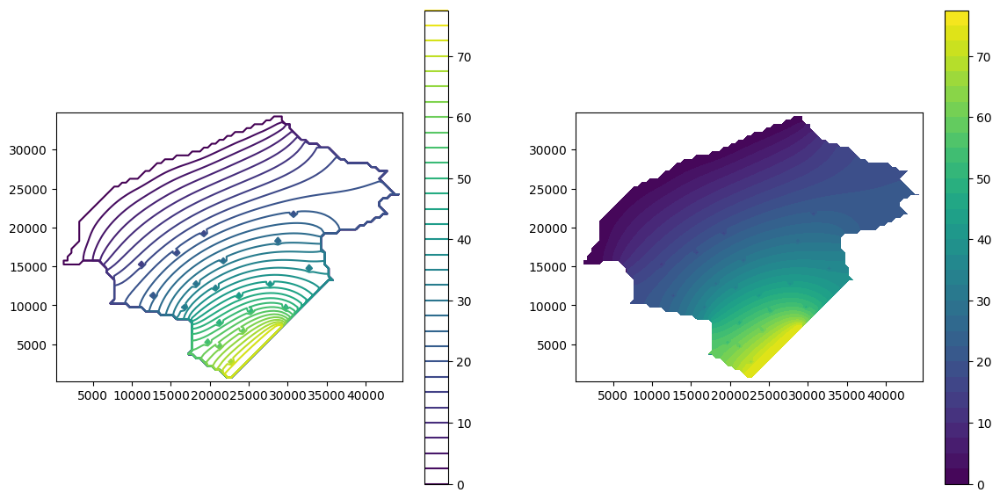

31.0


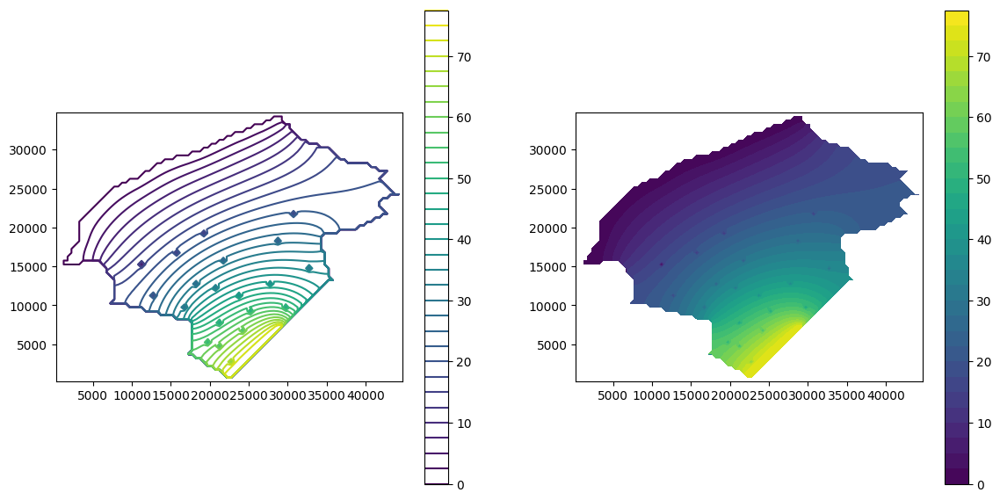

41.0


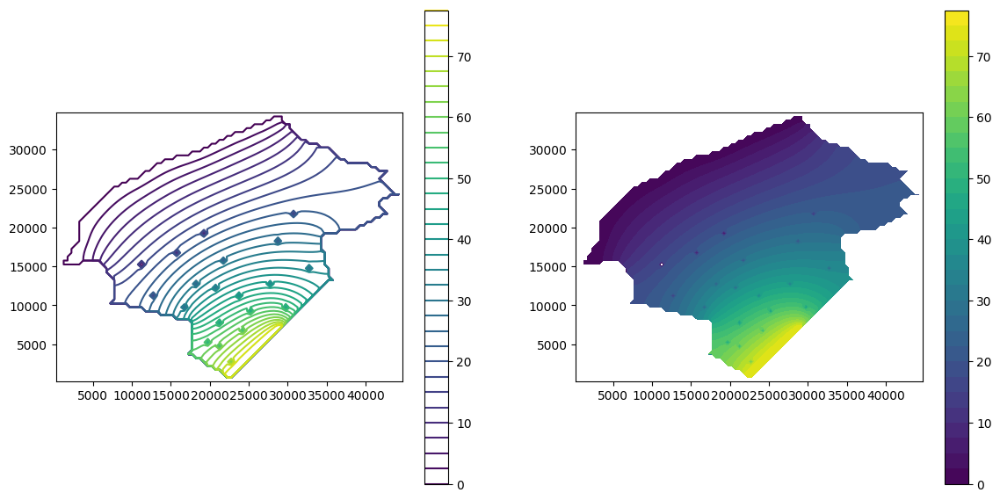

51.0


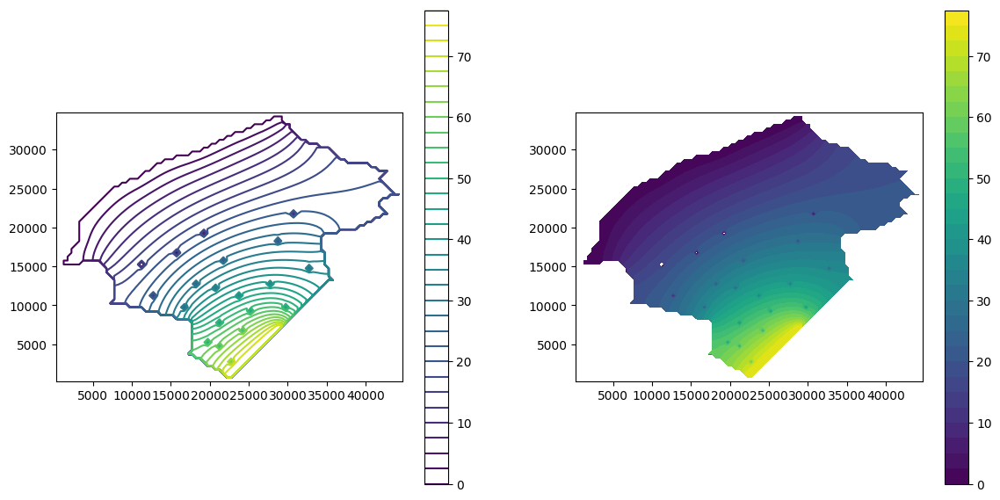

61.0


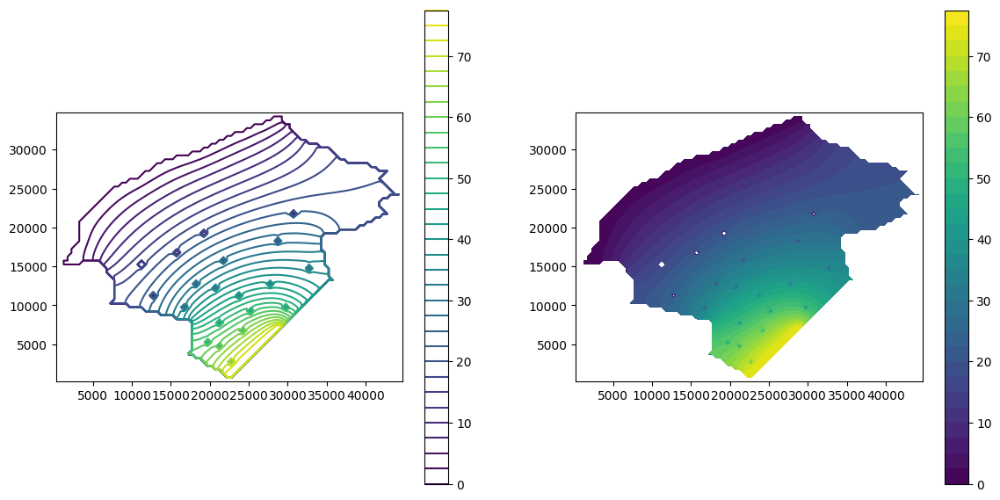

71.0


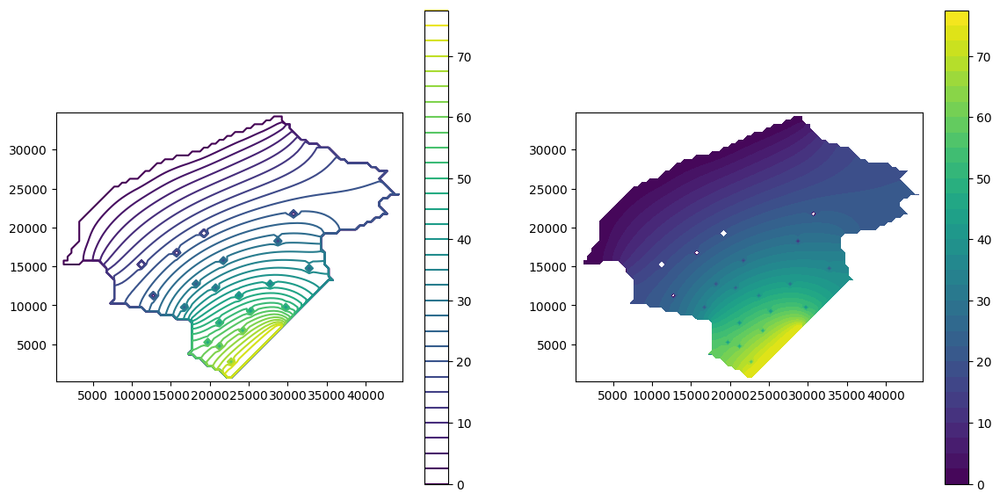

81.0


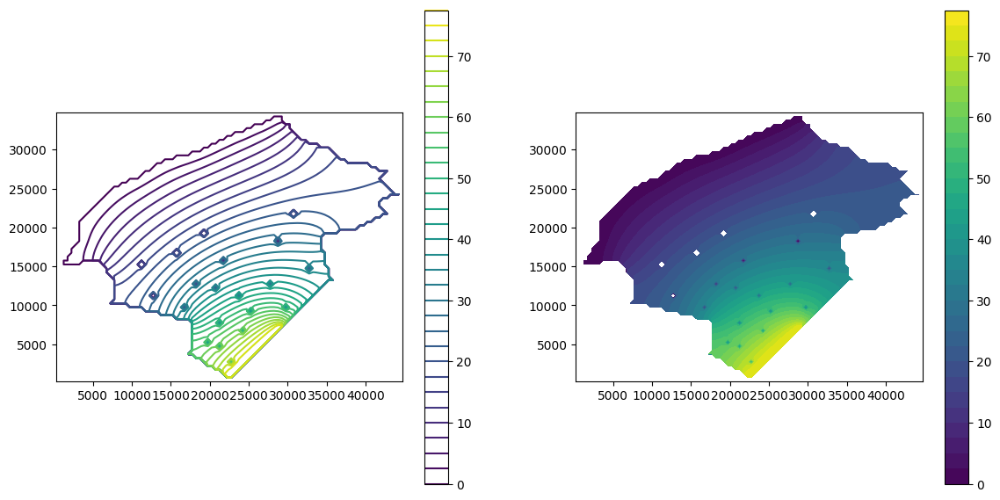

91.0


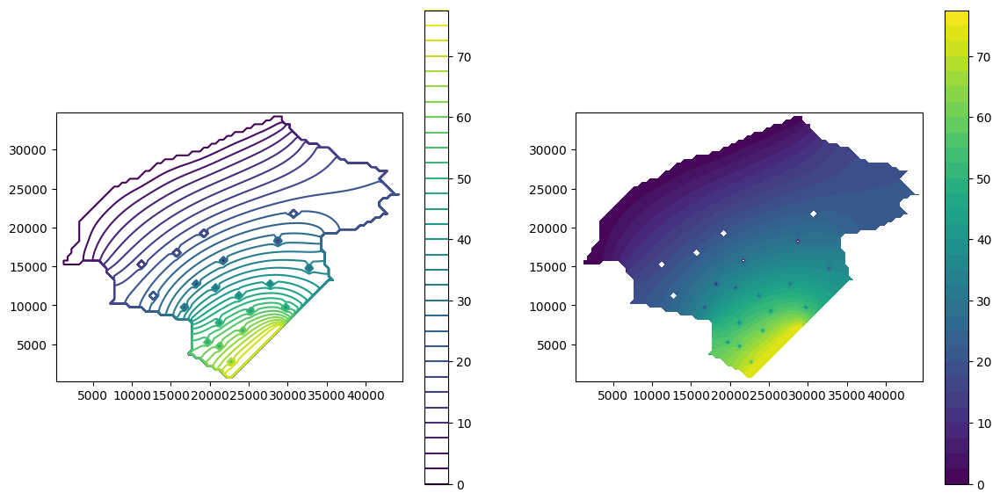

101.0


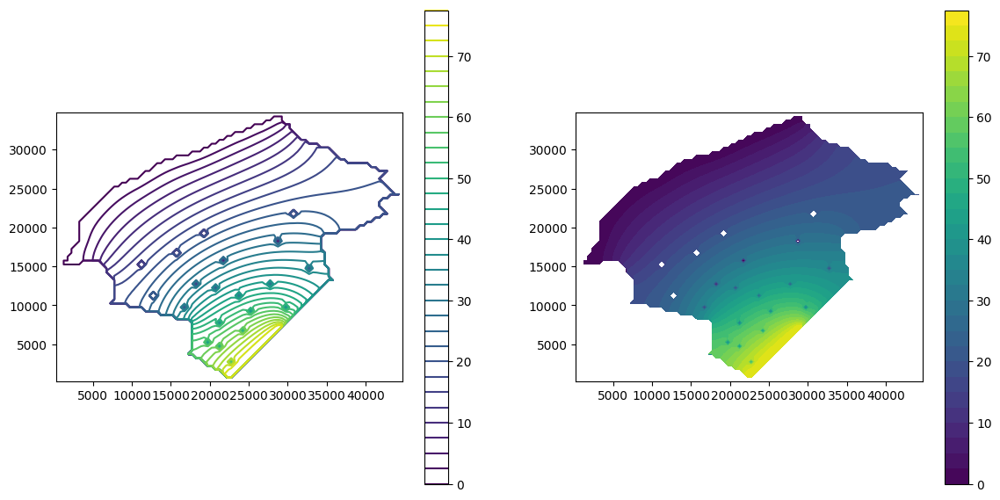

111.0


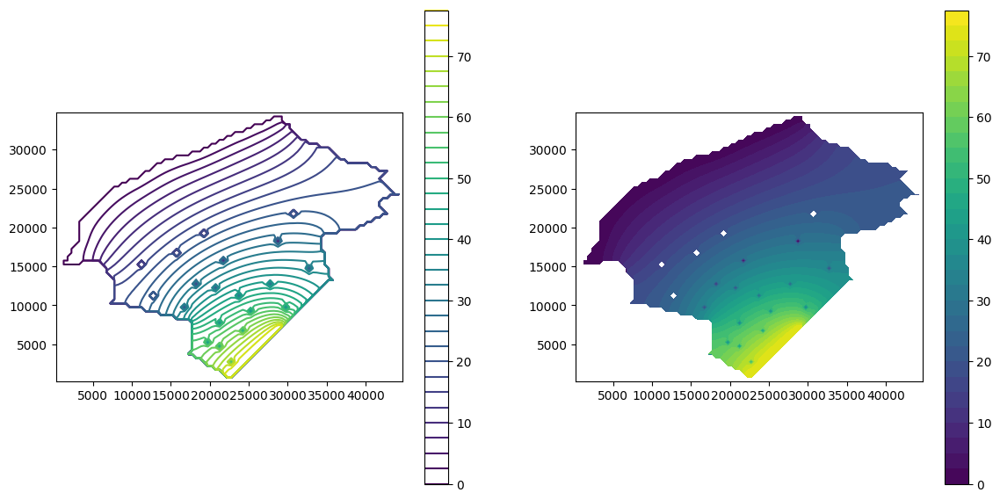

121.0


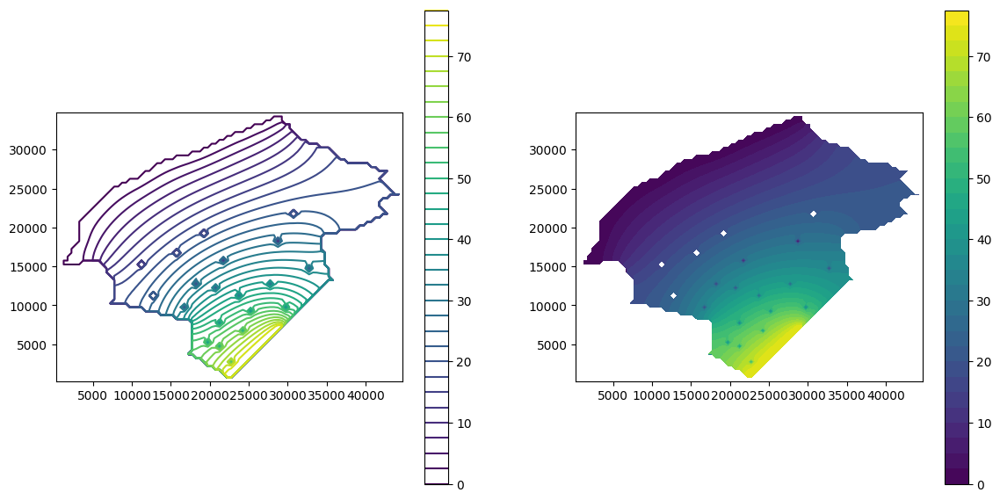

131.0


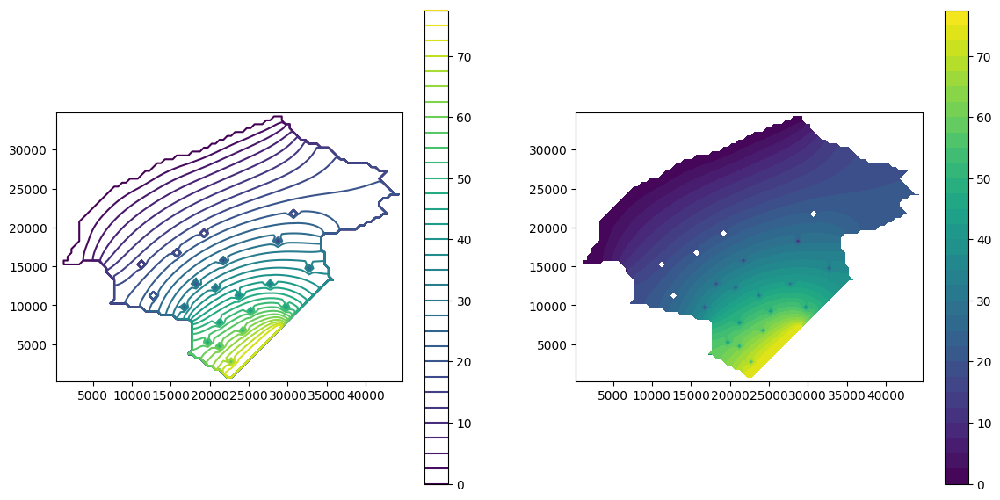

141.0


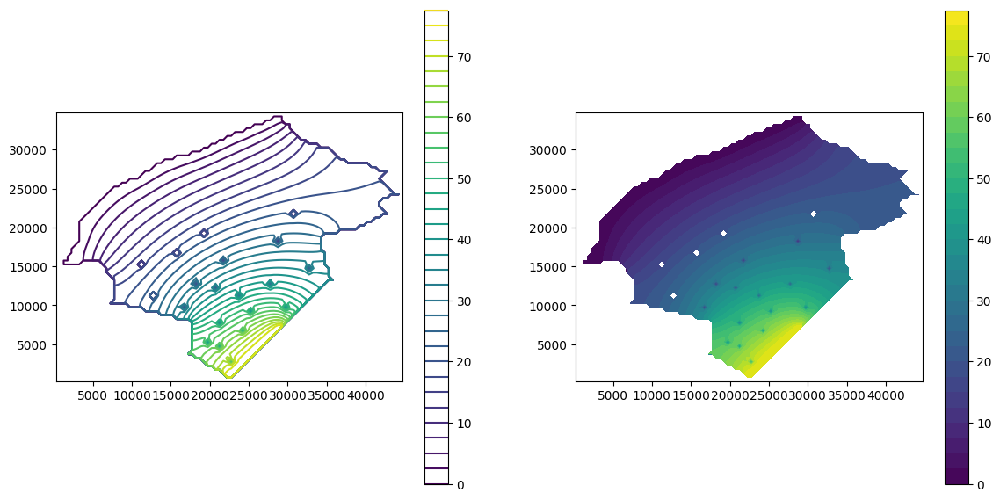

151.0


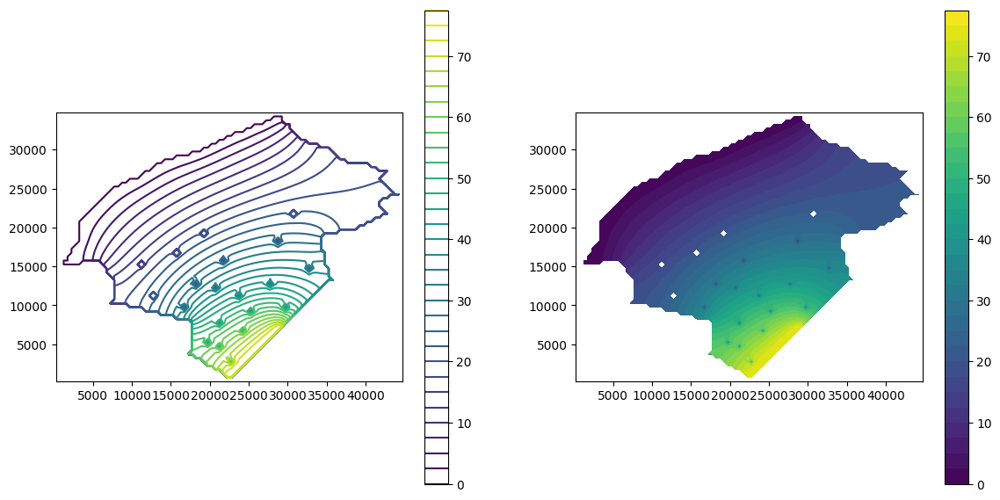

161.0


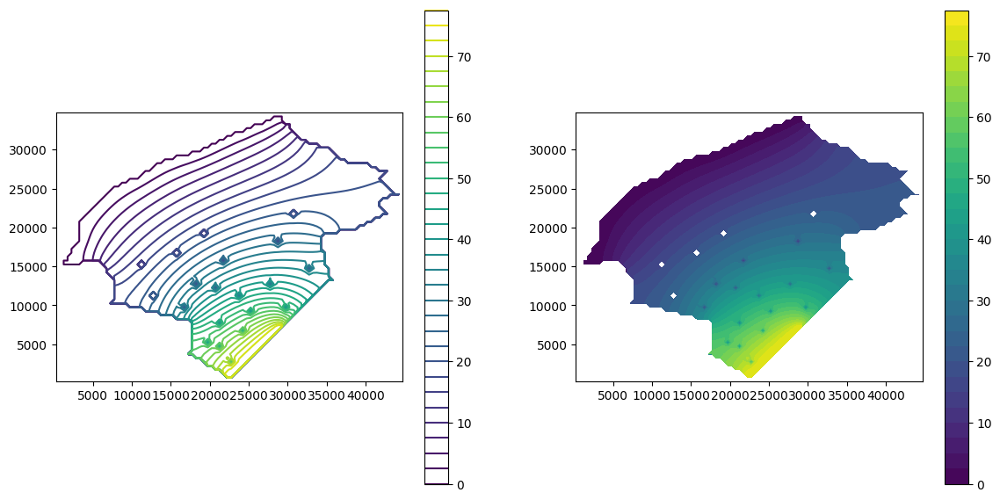

171.0


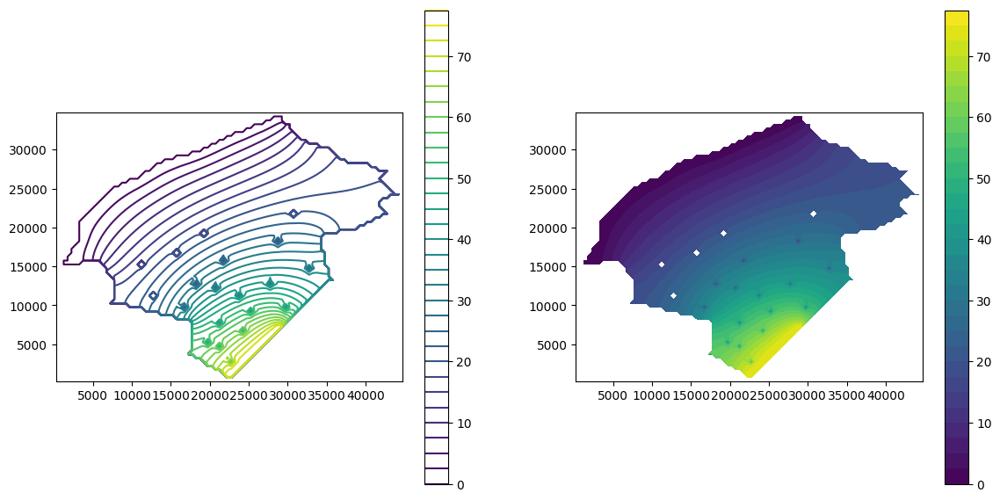

181.0


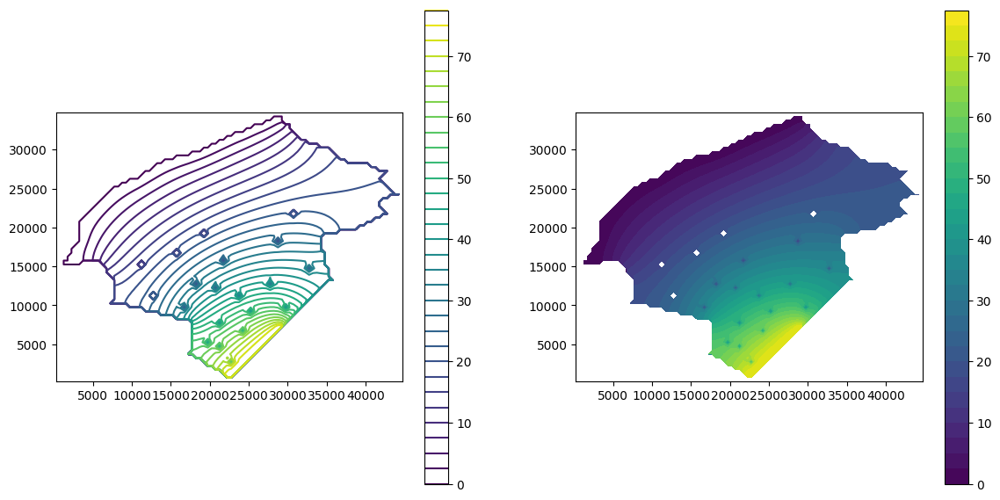

191.0


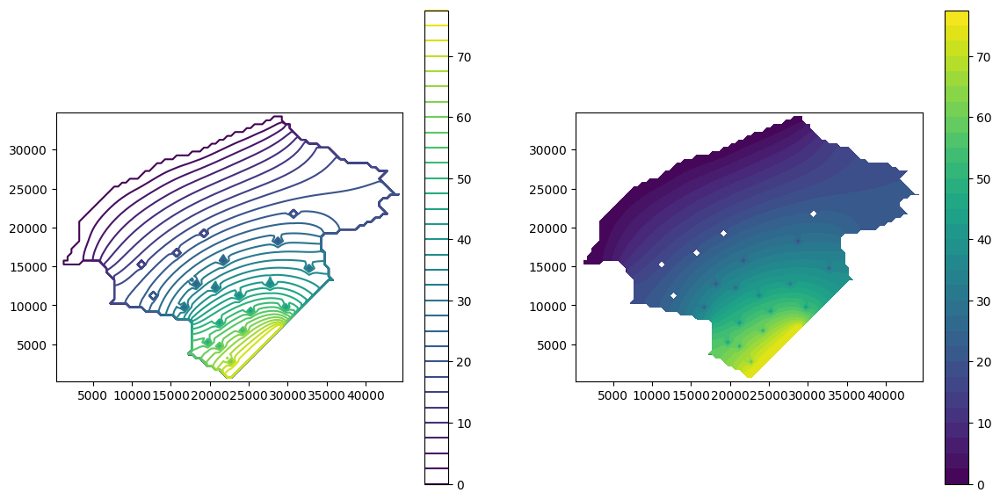

201.0


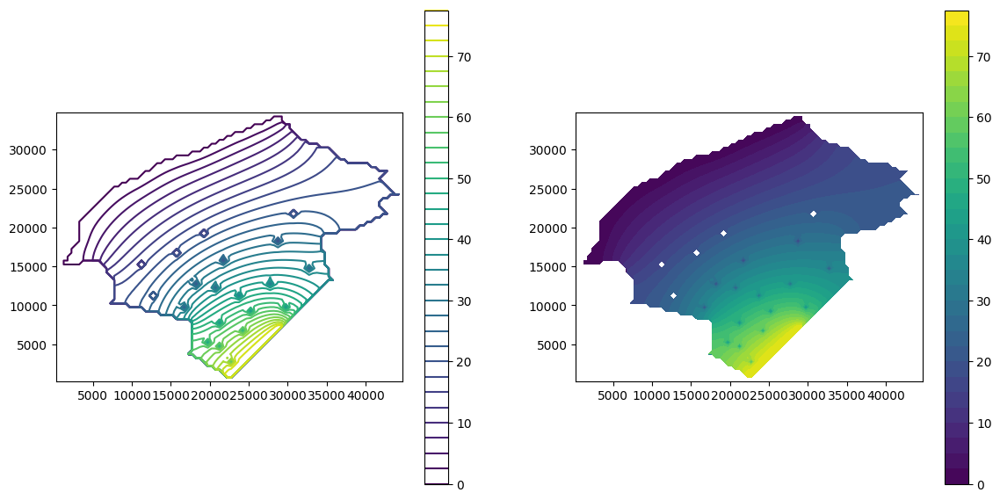

211.0


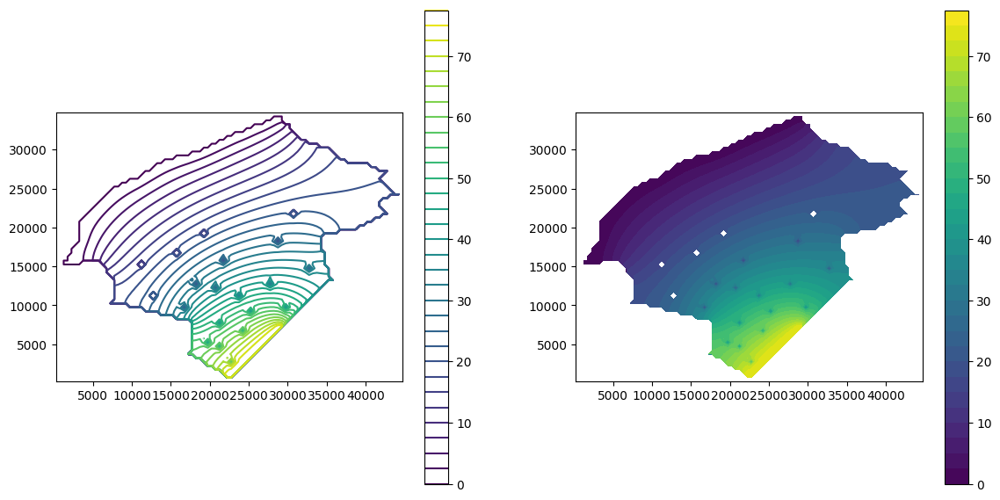

221.0


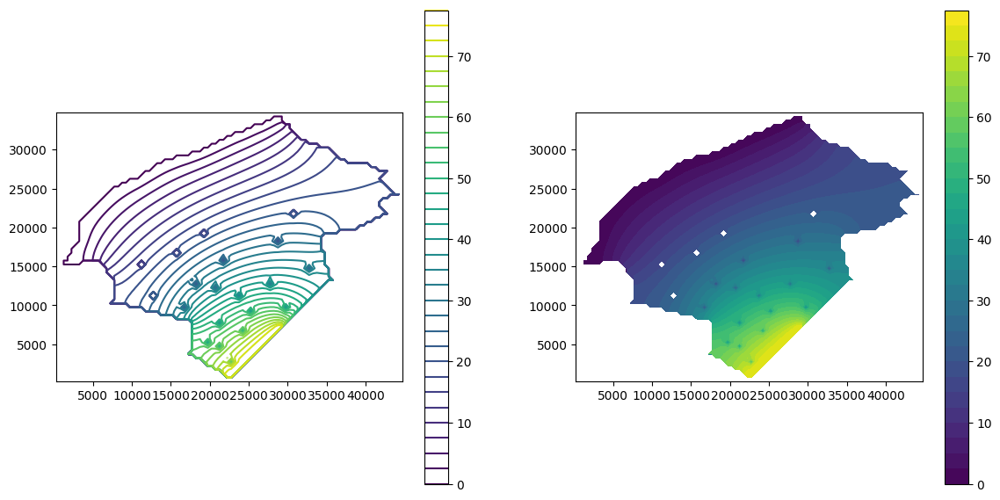

231.0


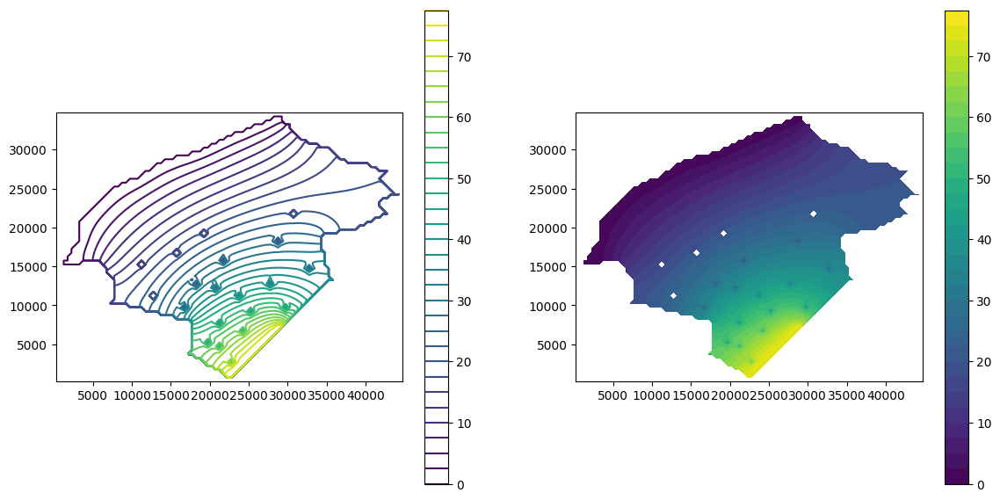

241.0


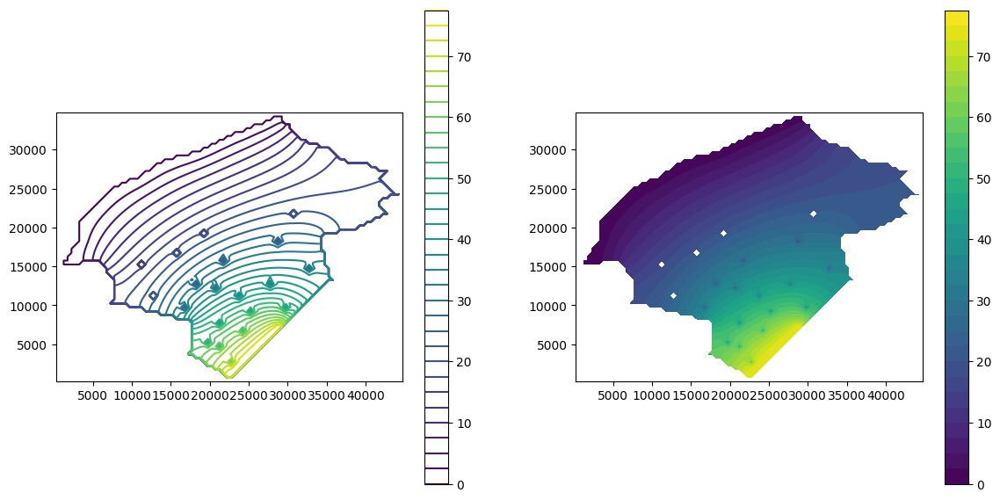

251.0


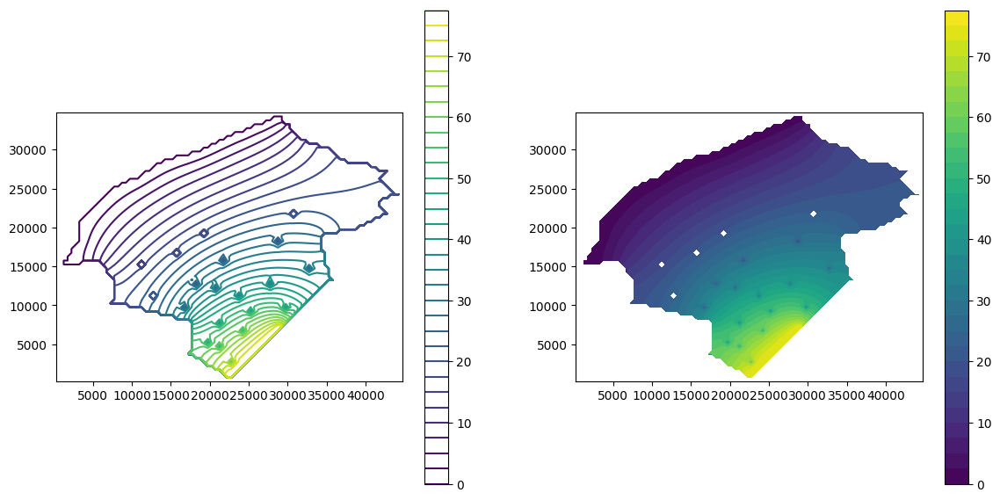

261.0


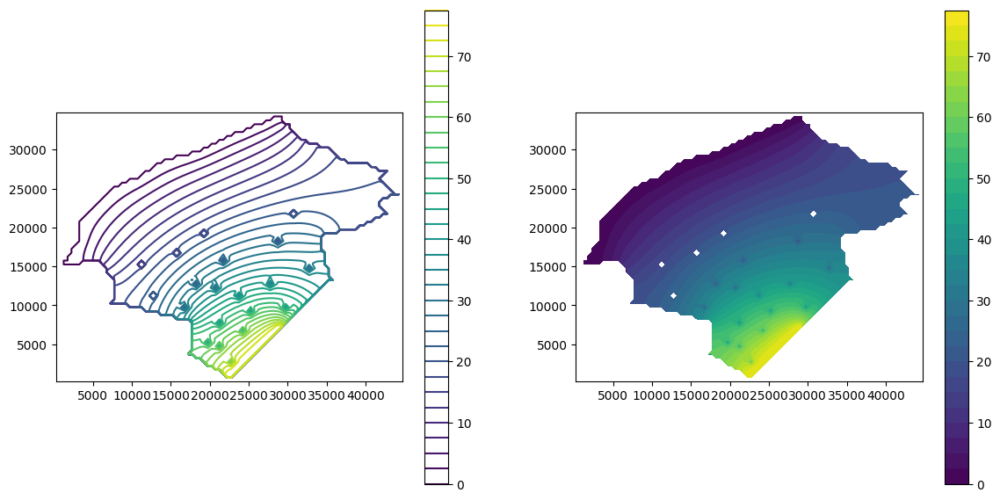

271.0


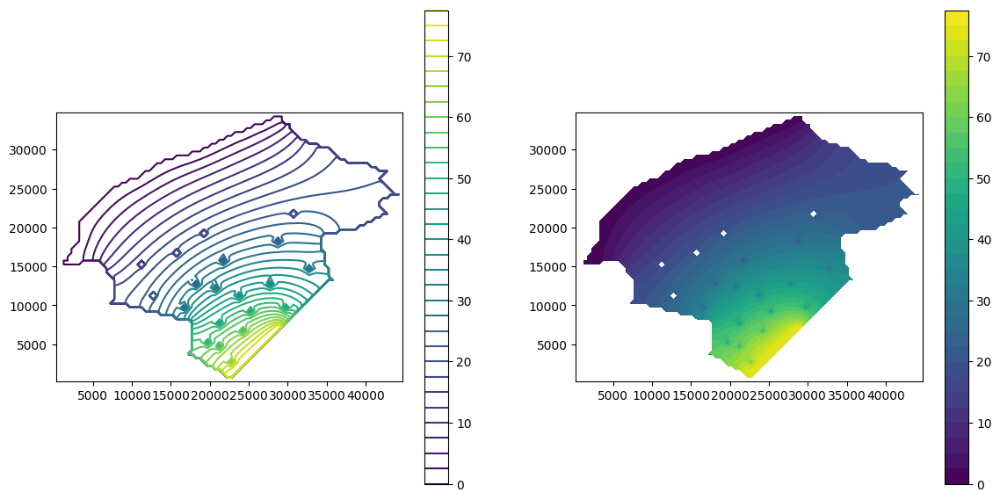

281.0


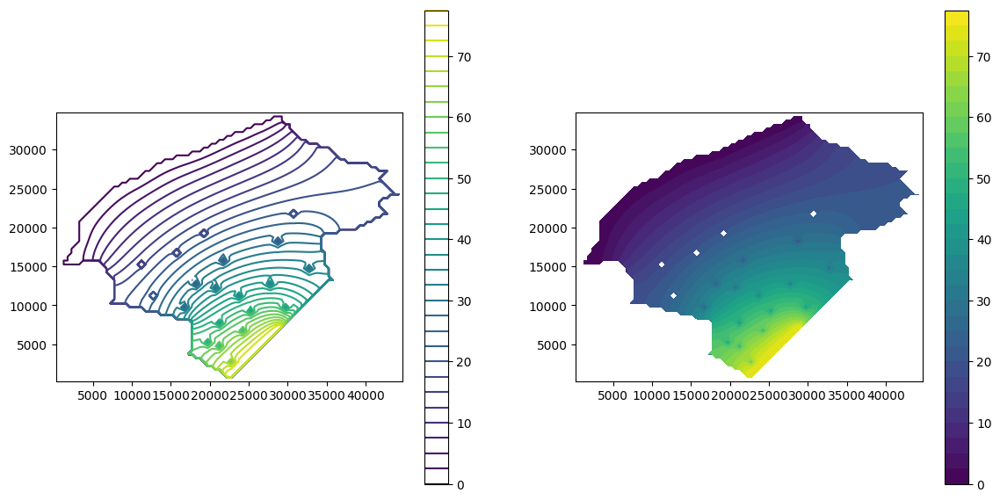

291.0


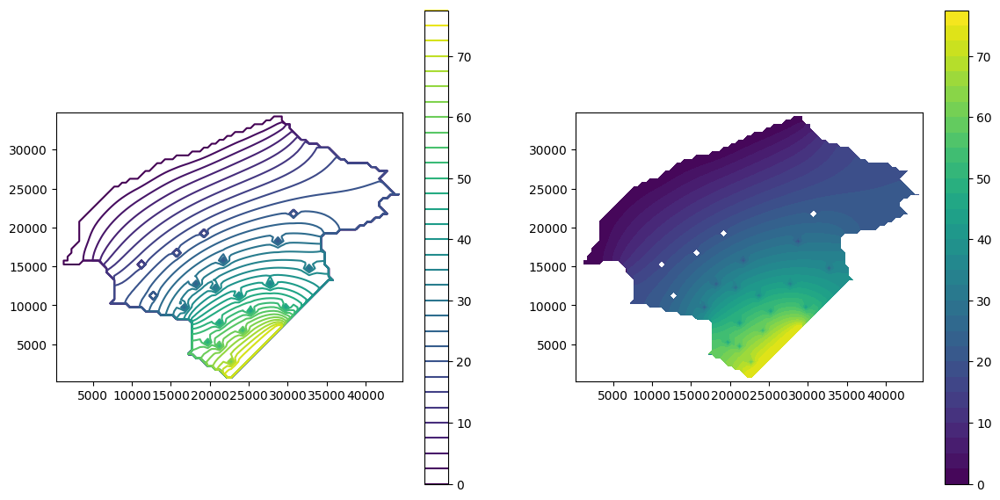

301.0


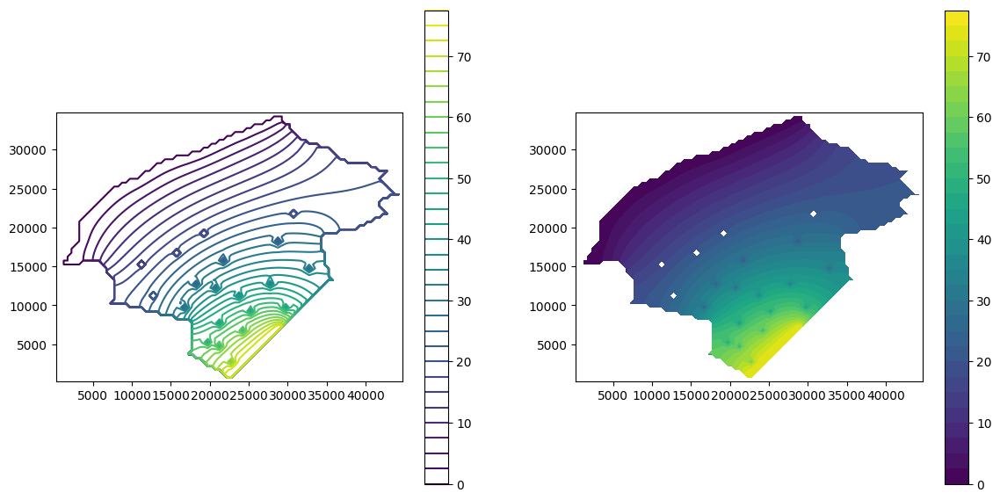

311.0


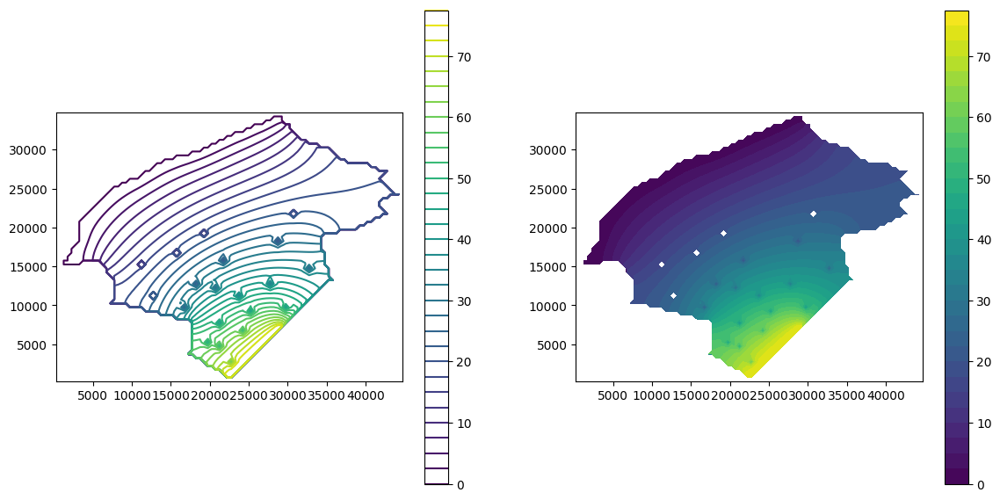

321.0


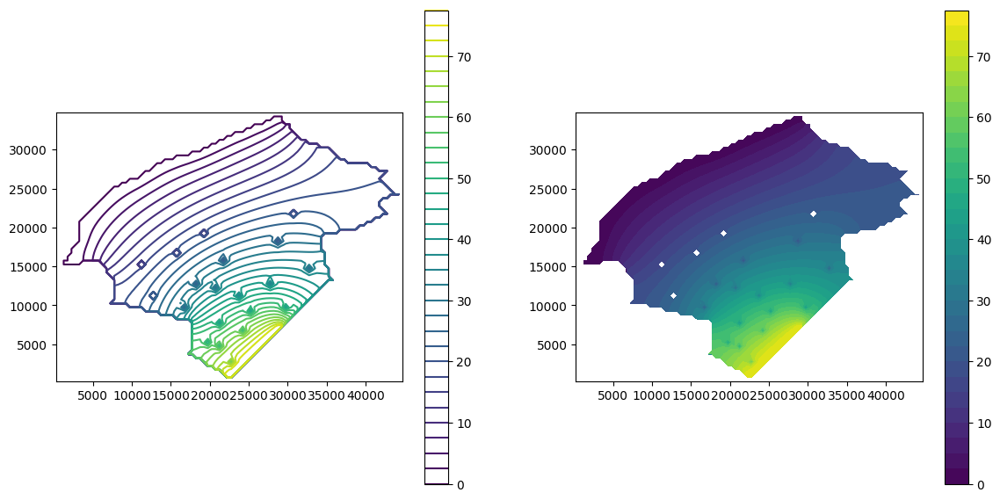

331.0


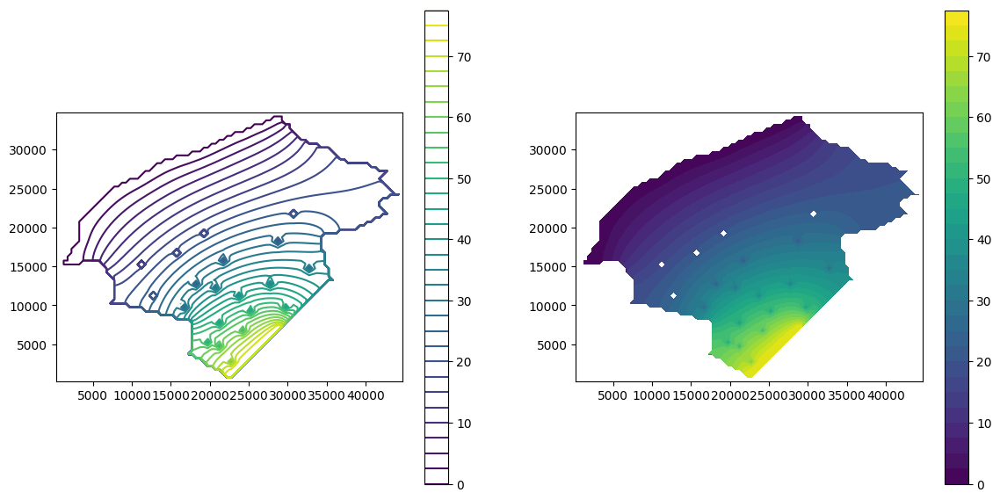

341.0


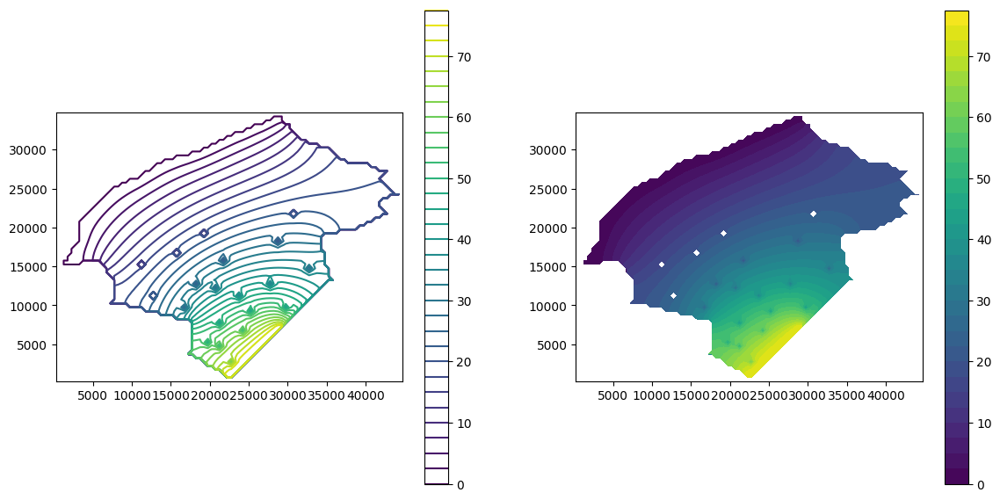

351.0


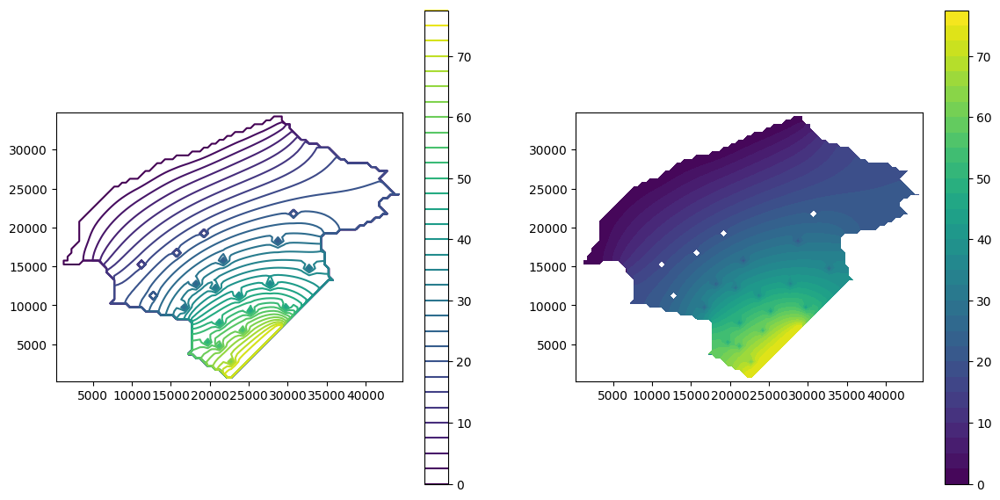

361.0


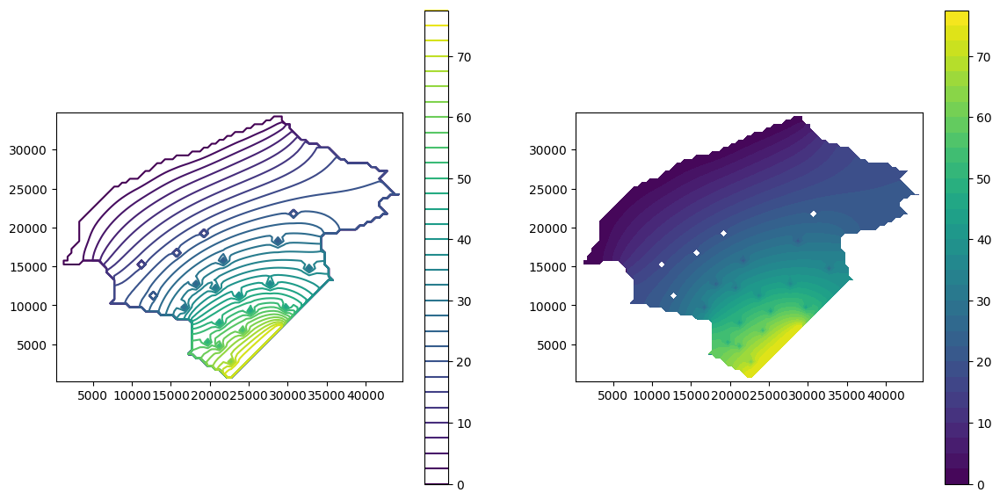

371.0


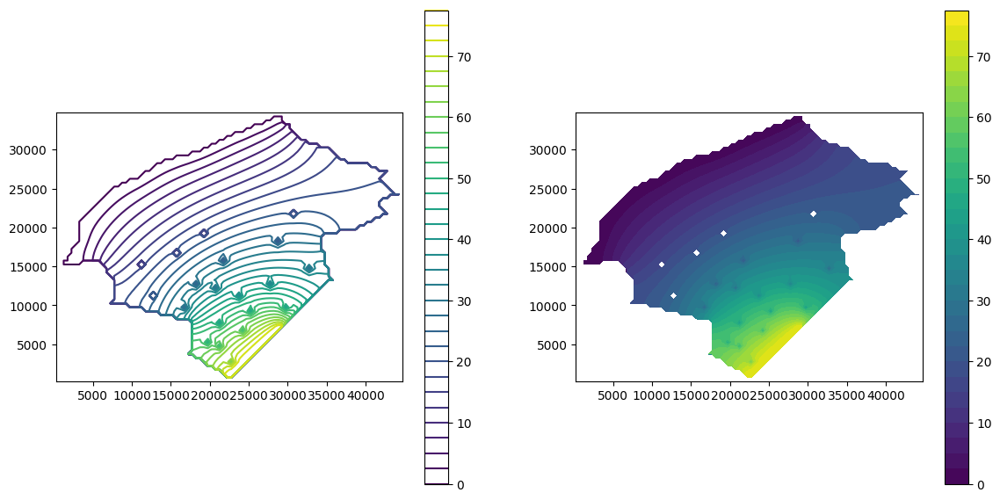

381.0


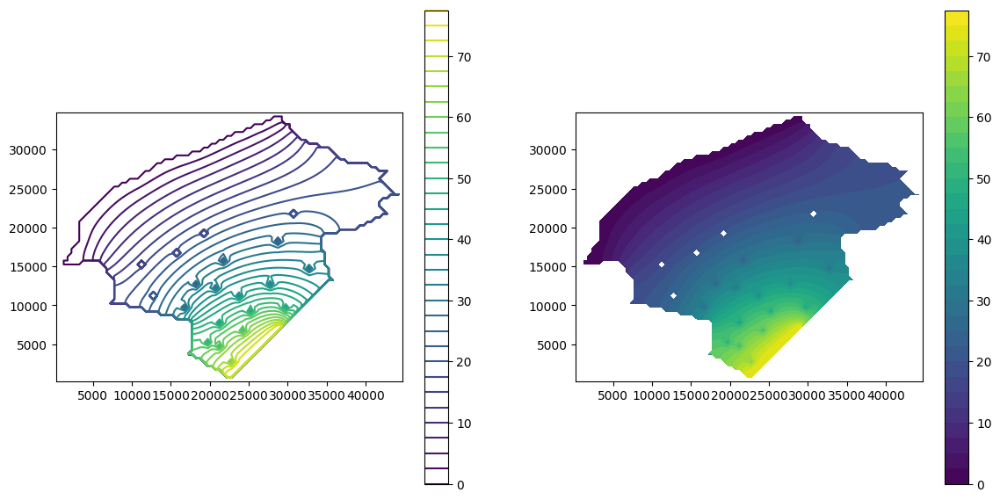

391.0


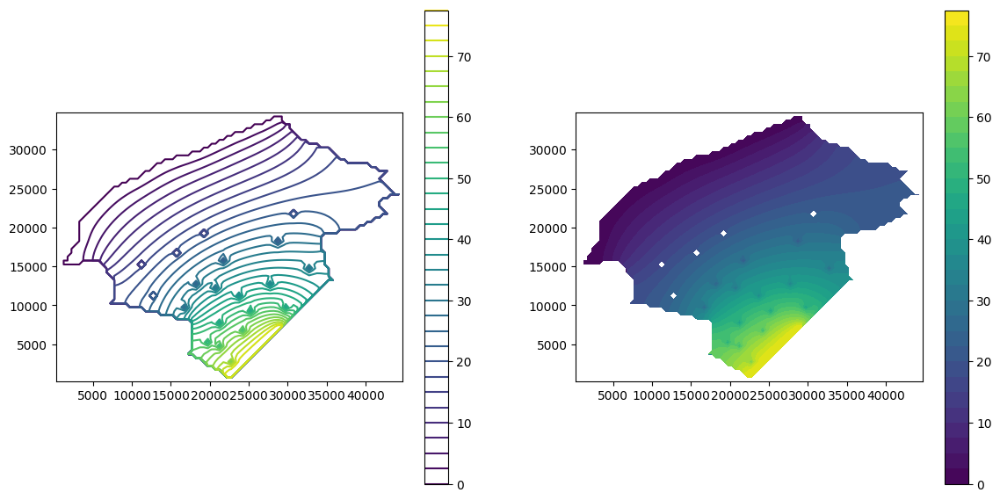

401.0


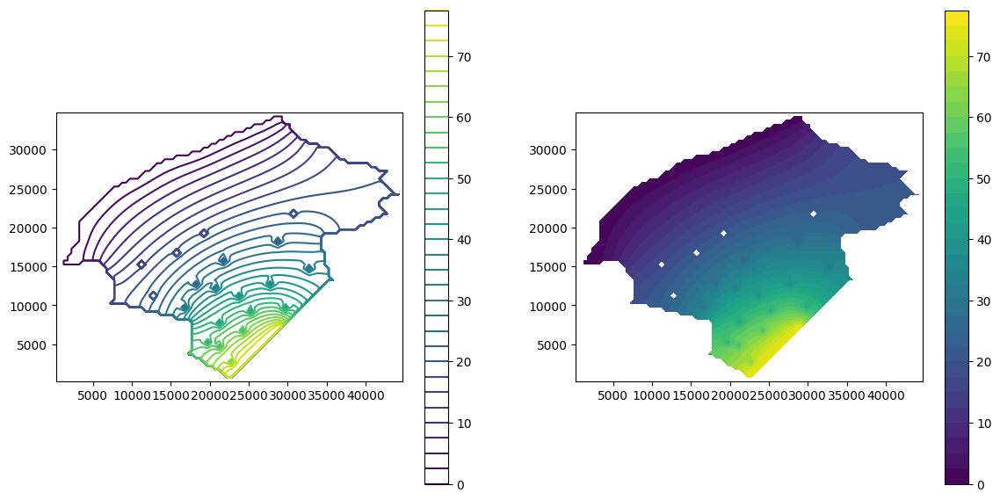

411.0


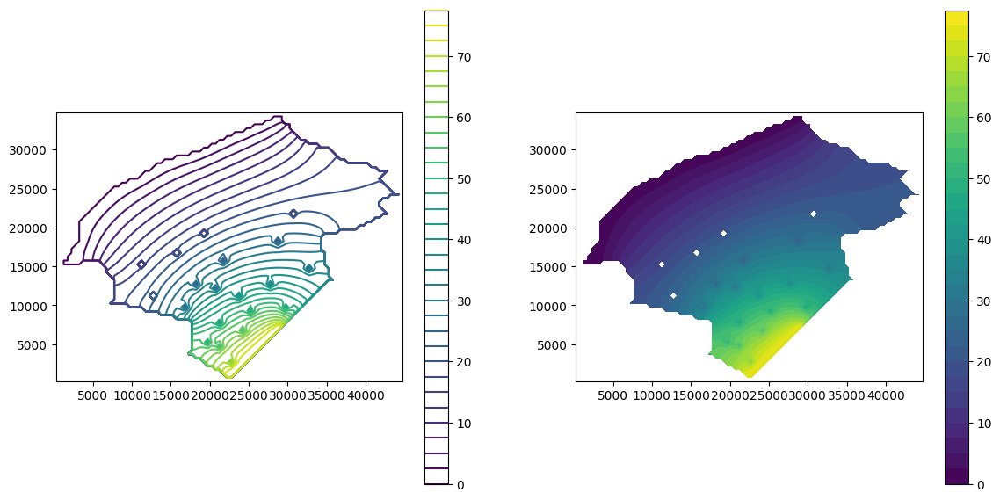

421.0


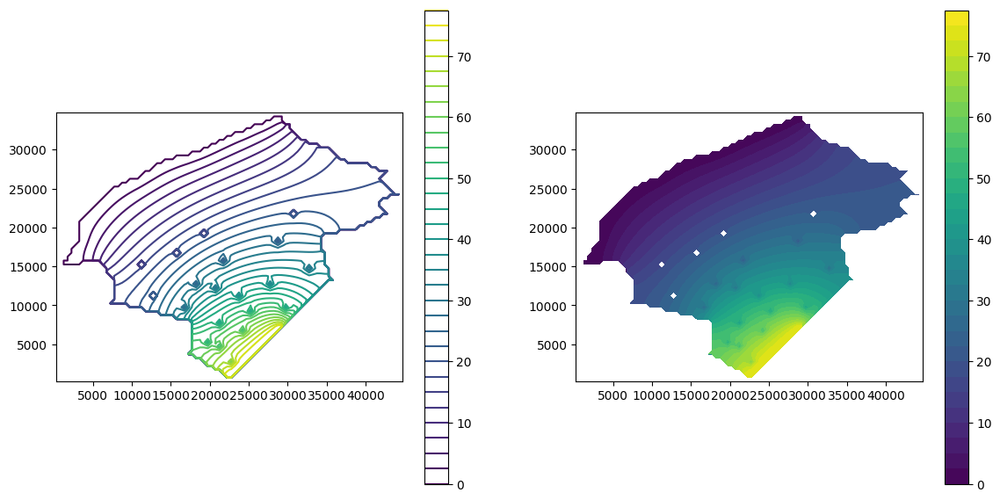

431.0


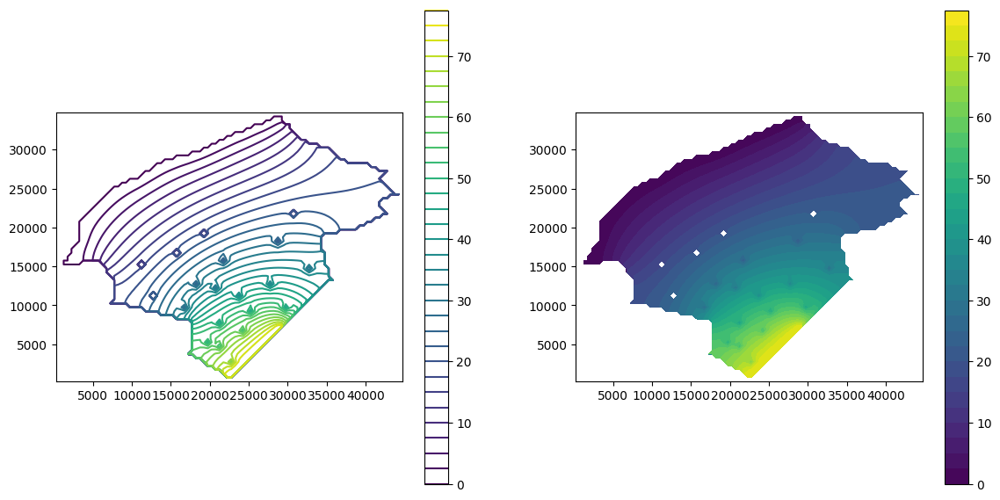

441.0


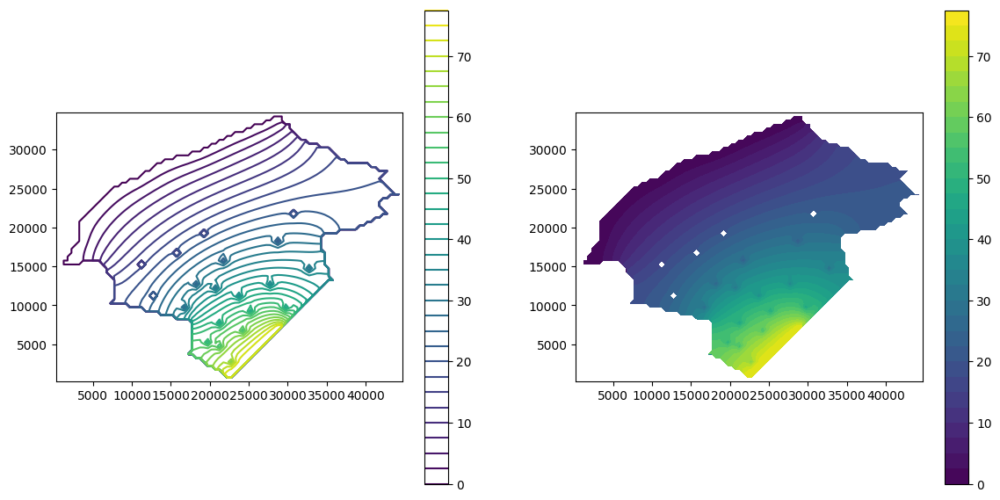

451.0


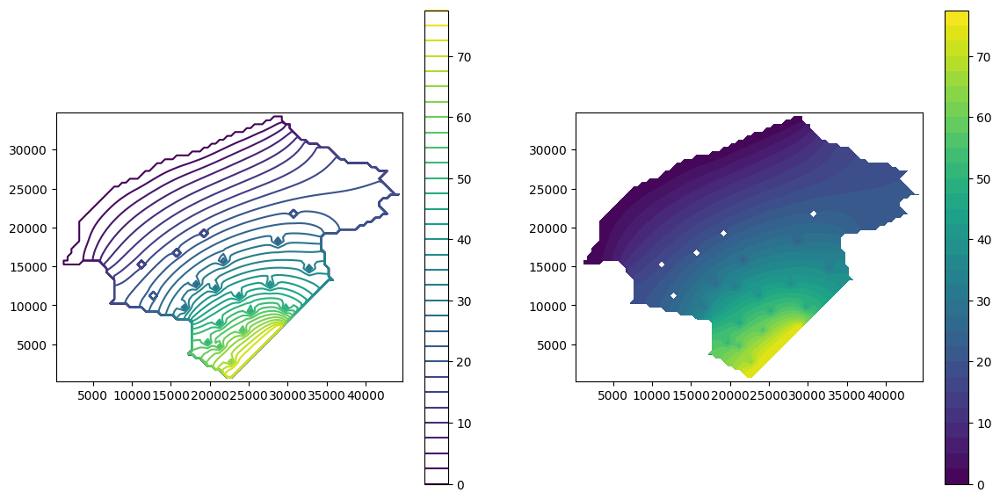

461.0


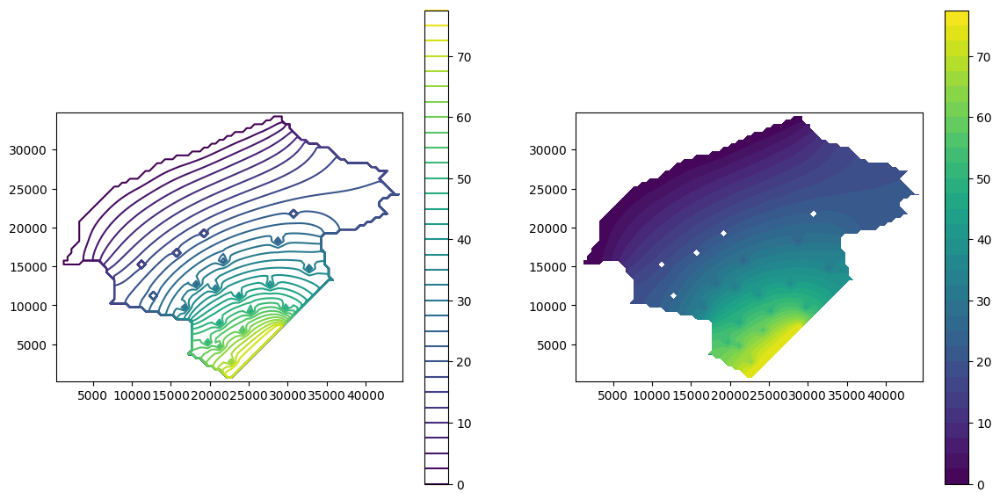

471.0


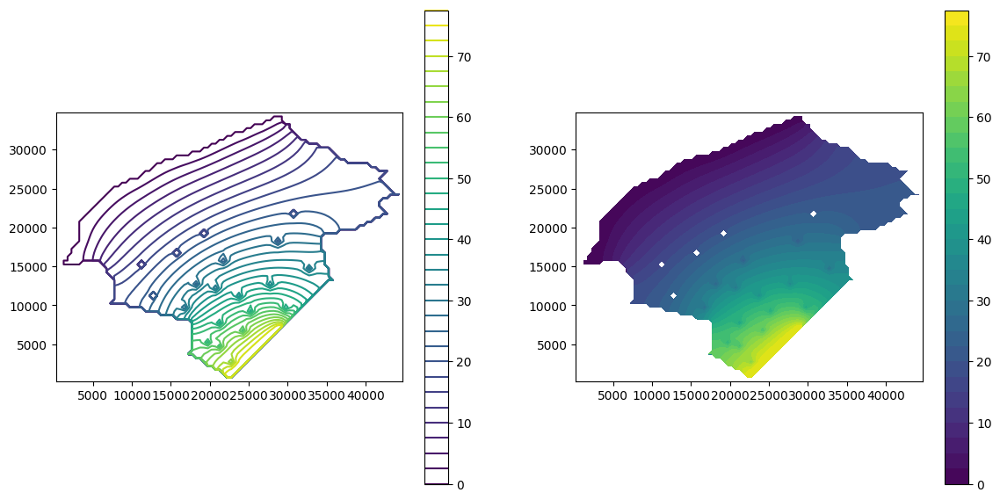

481.0


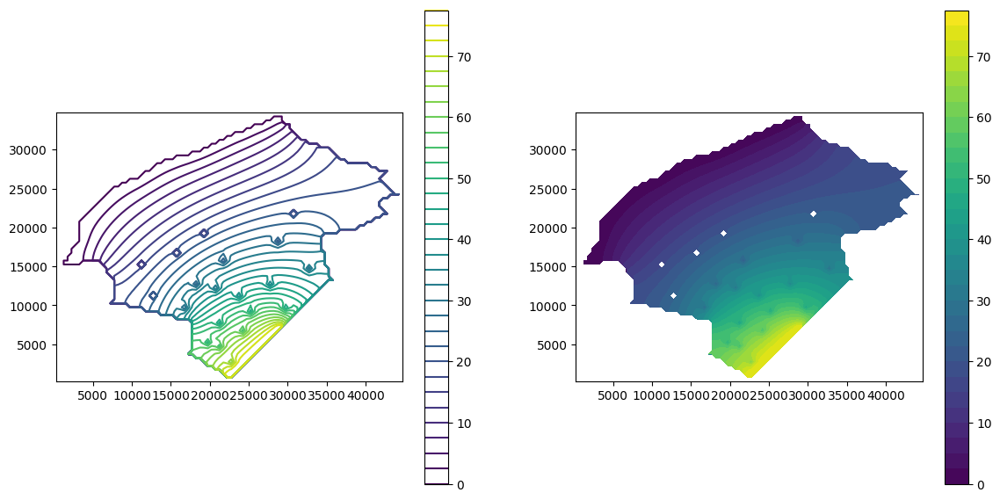

491.0


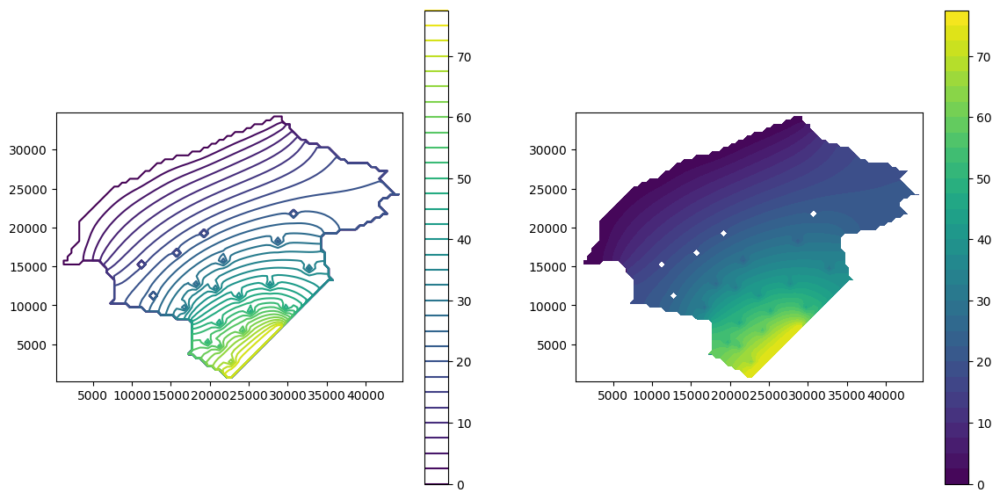

501.0


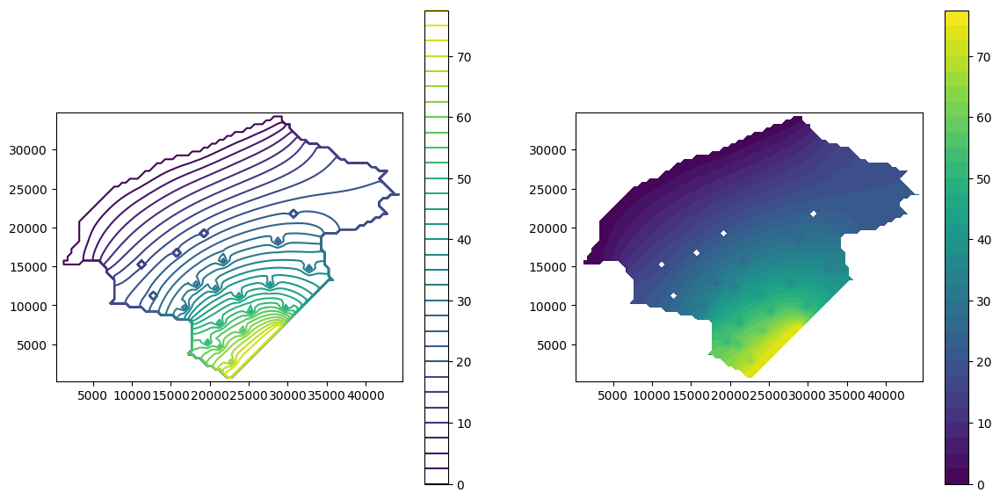

511.0


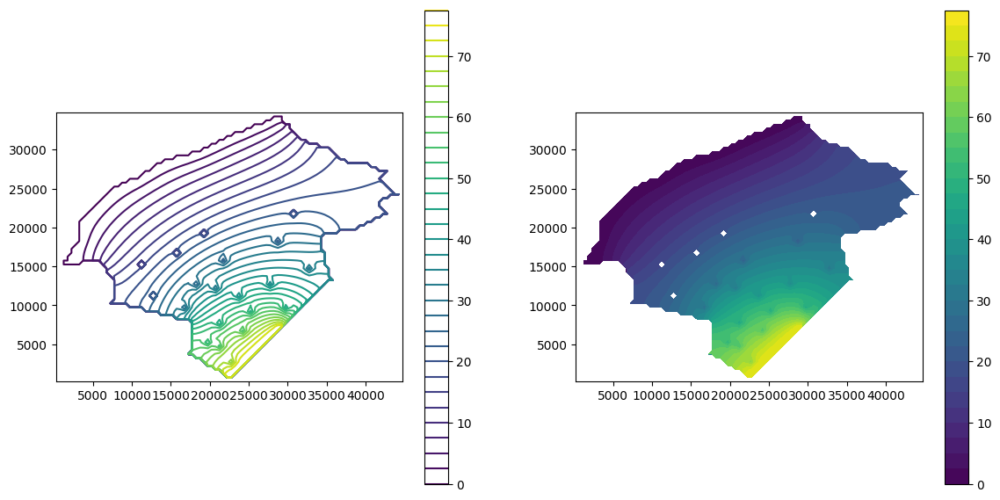

521.0


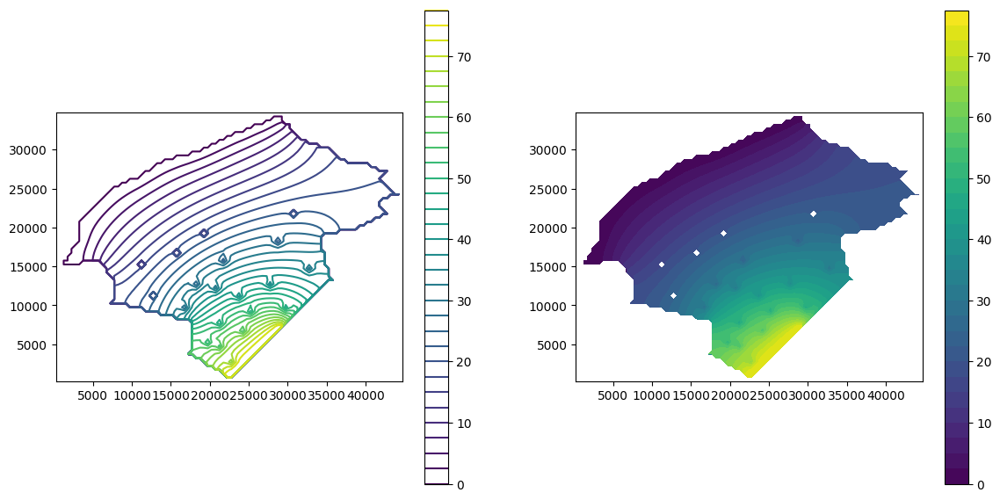

531.0


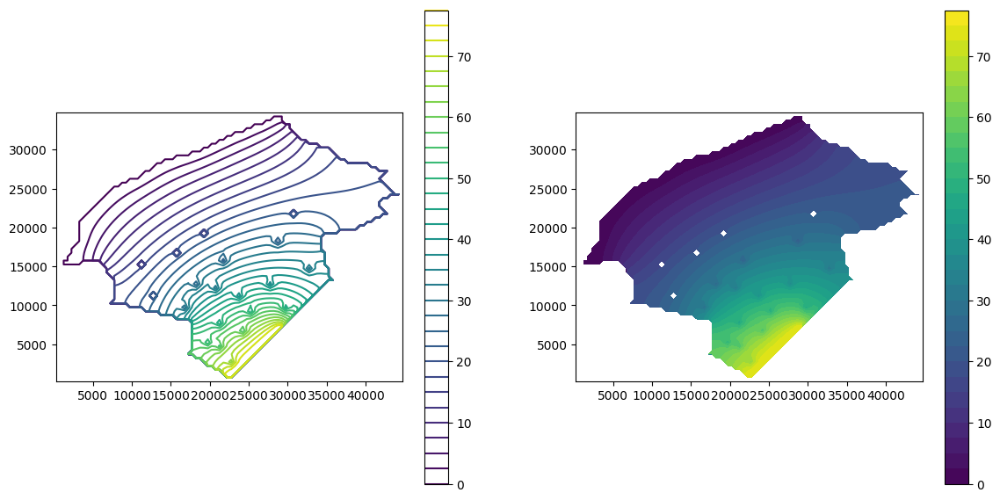

541.0


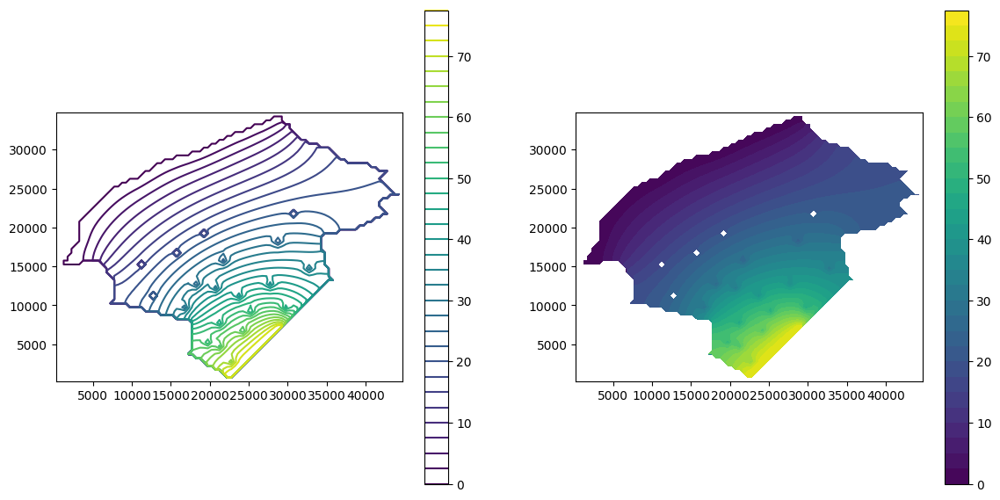

551.0


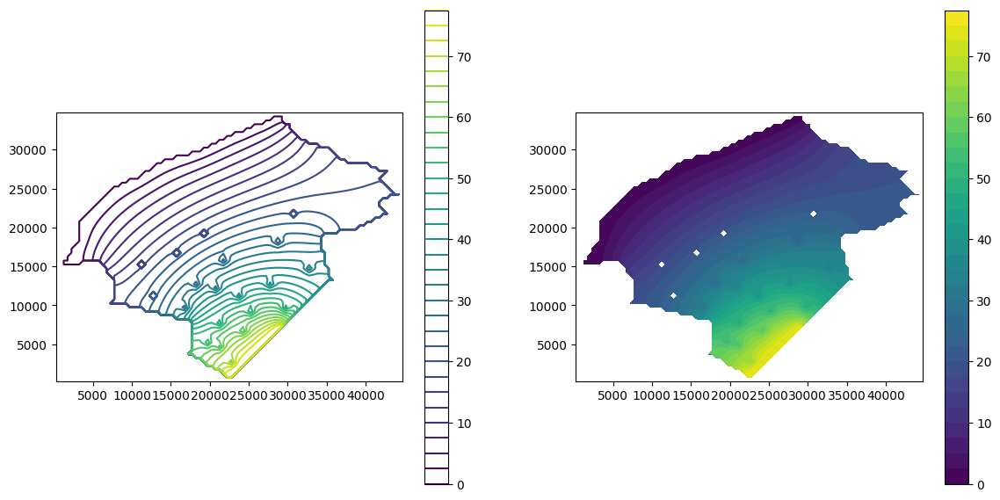

561.0


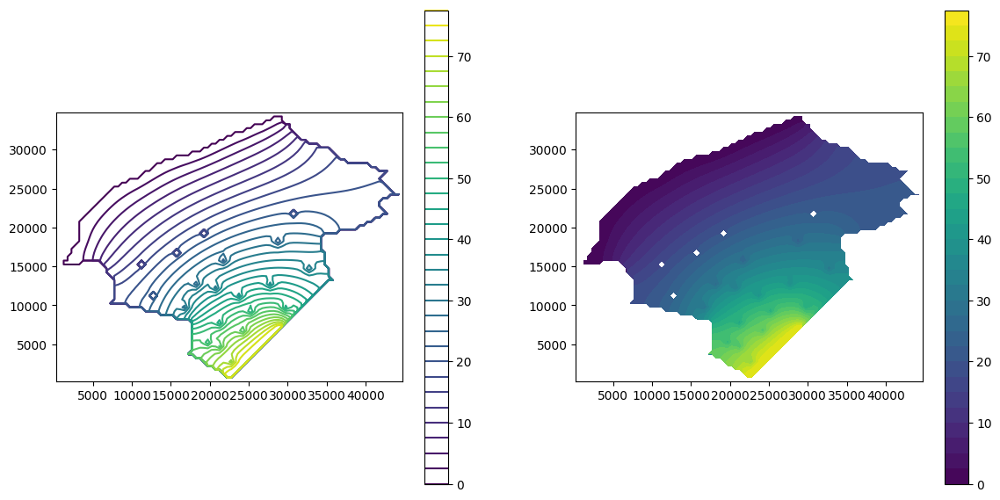

571.0


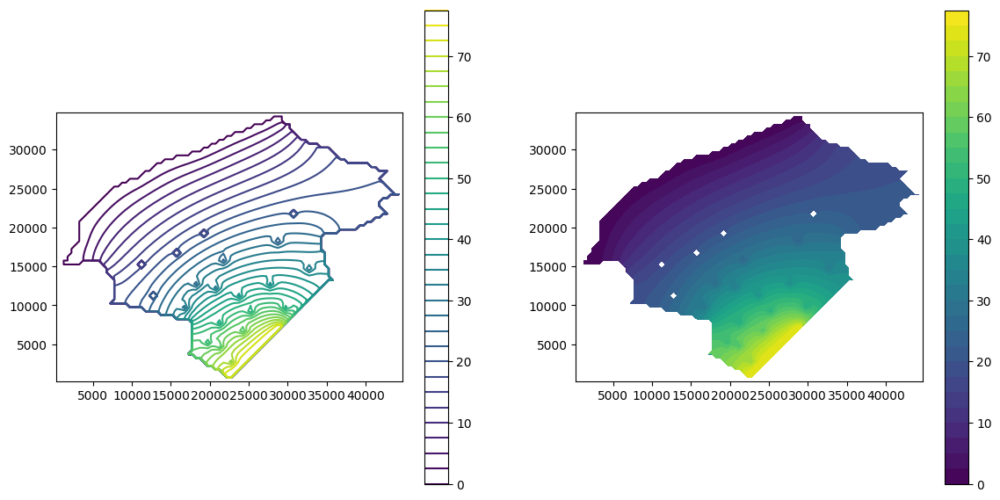

581.0


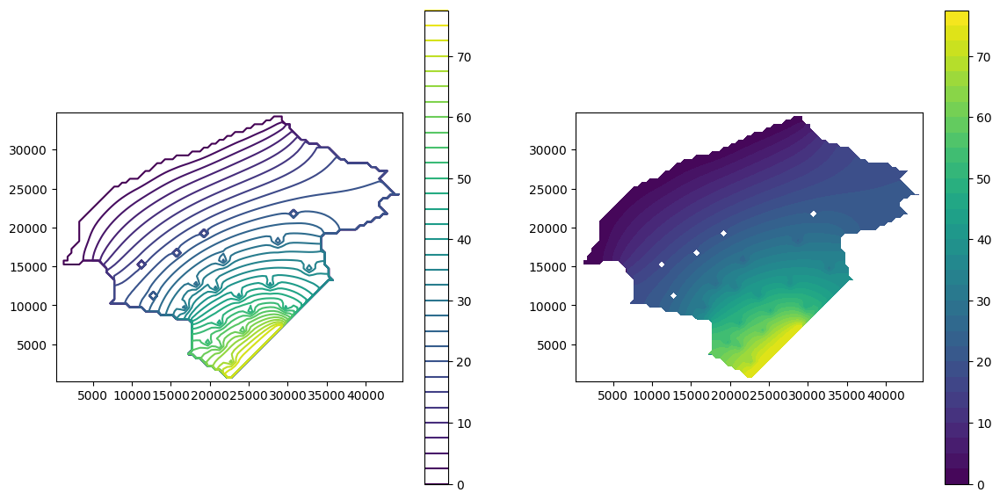

591.0


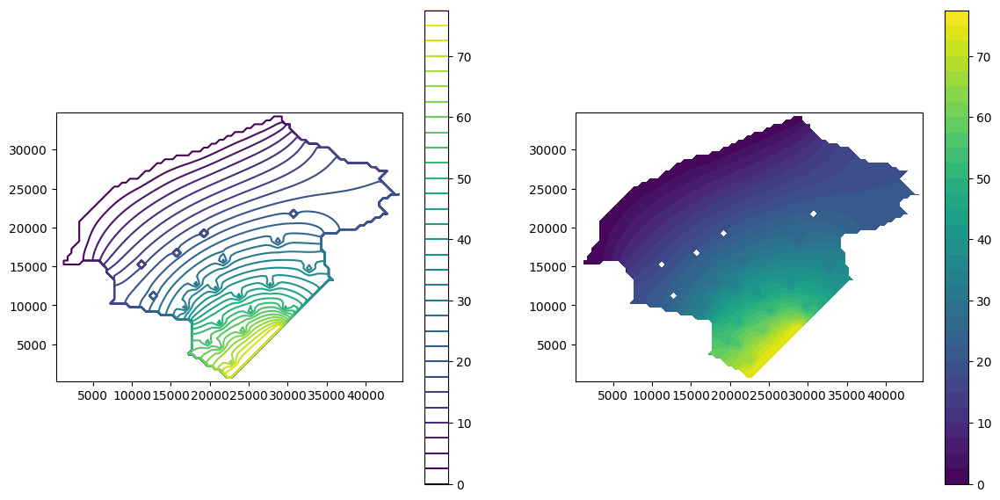

601.0


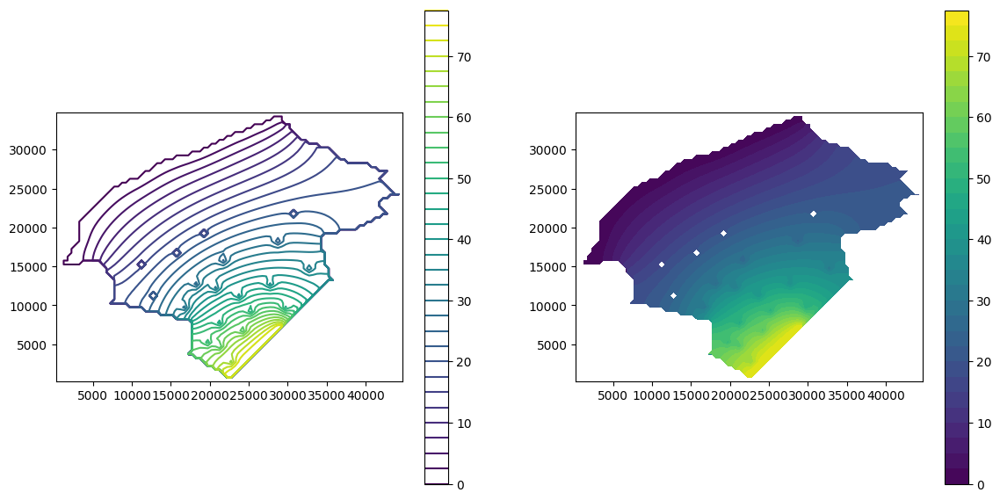

611.0


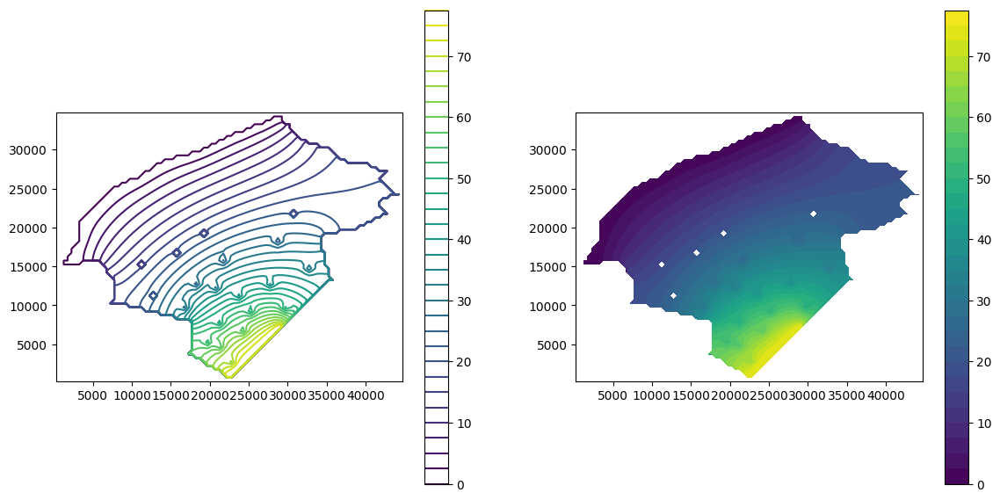

621.0


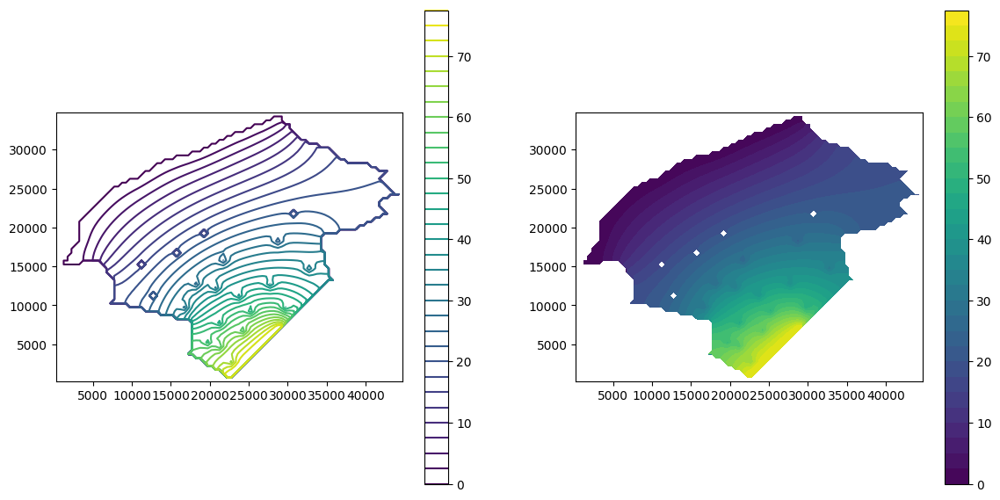

631.0


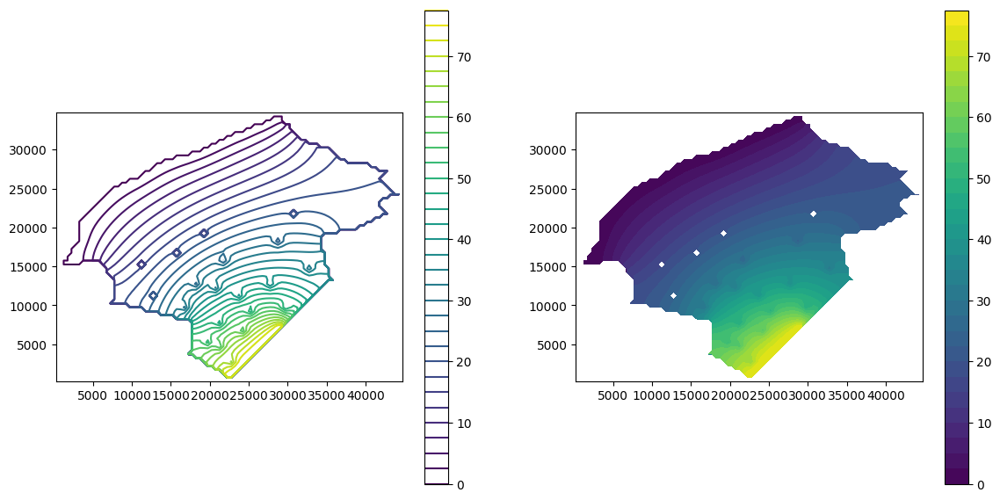

641.0


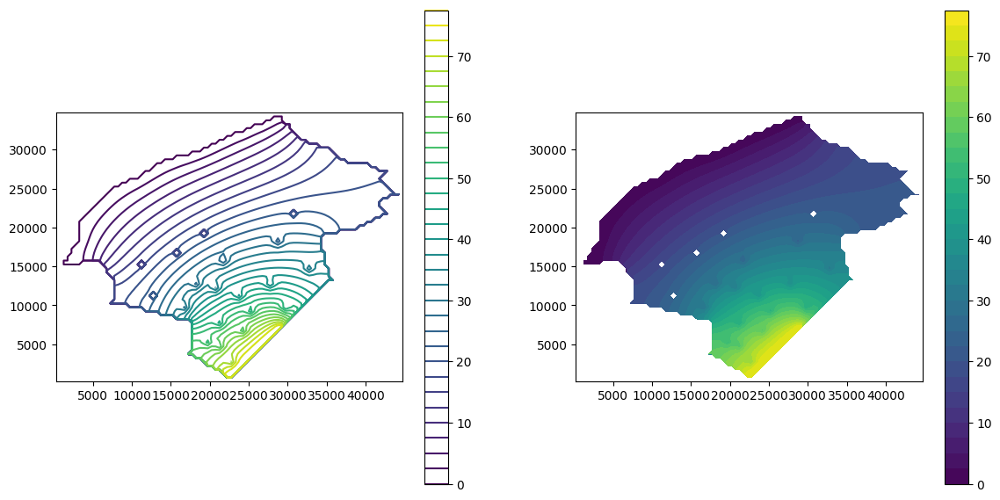

651.0


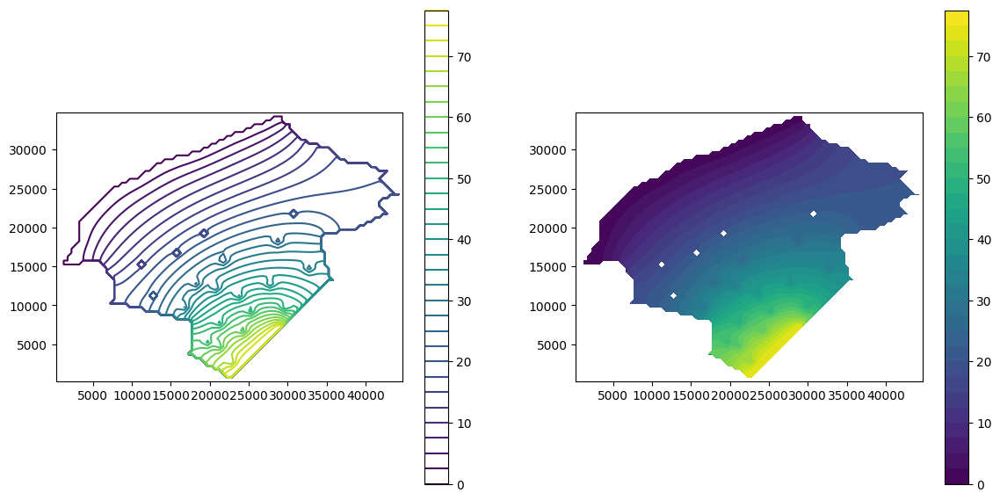

661.0


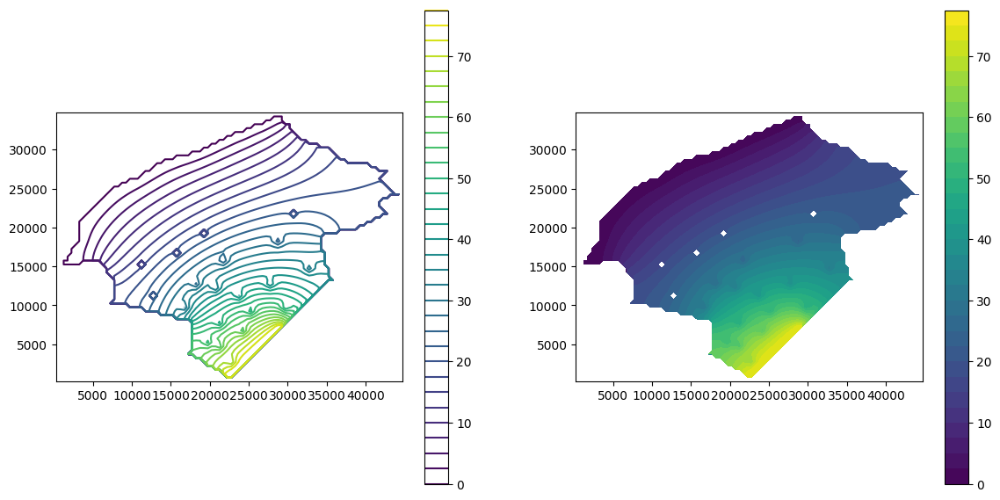

671.0


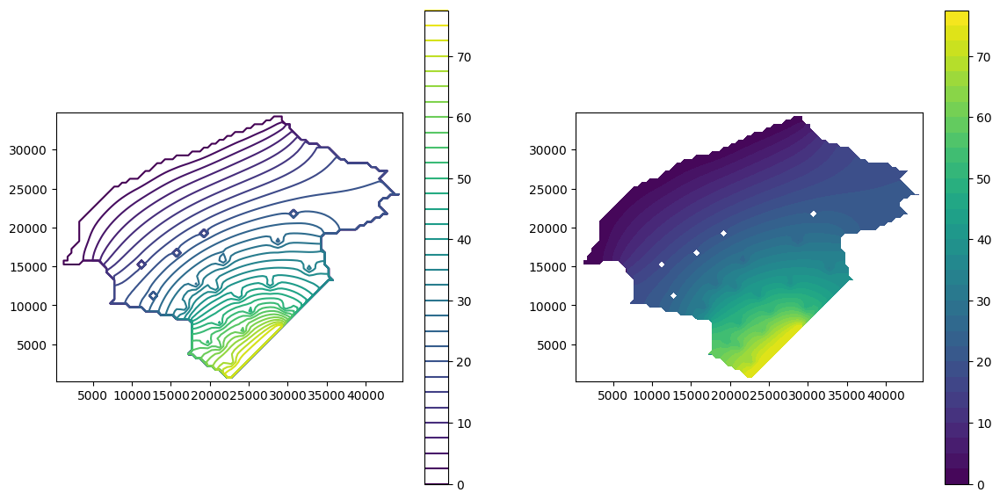

681.0


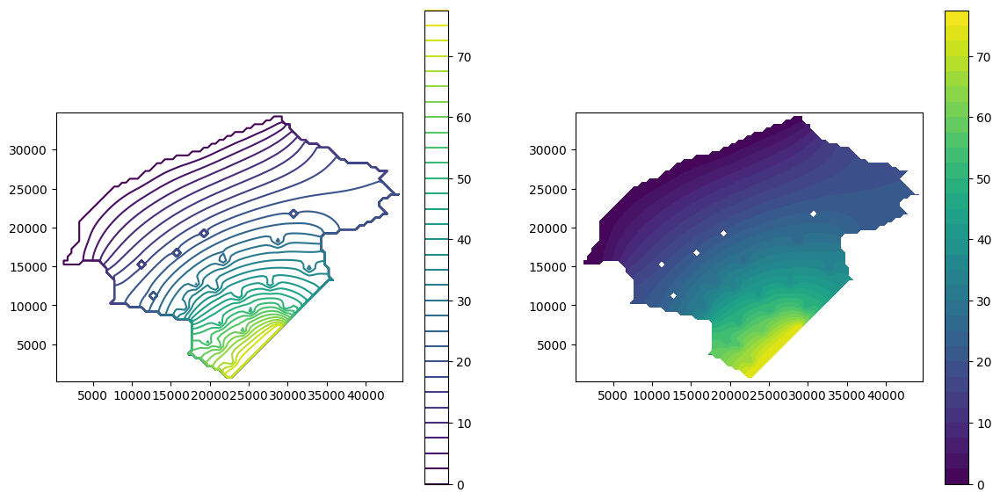

691.0


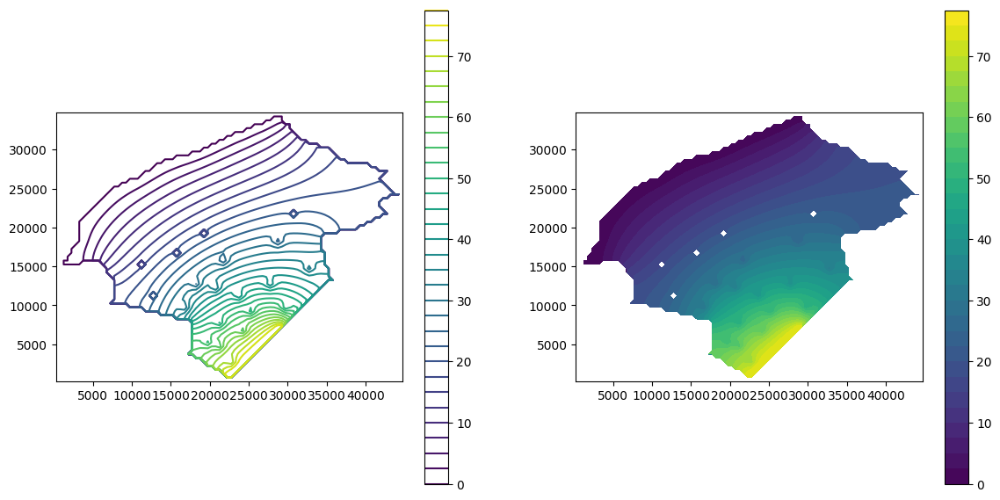

701.0


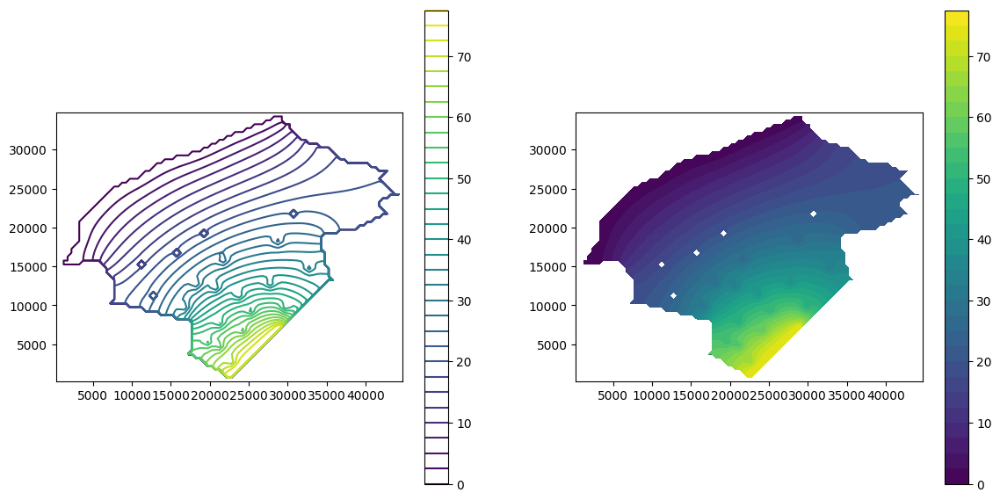

711.0


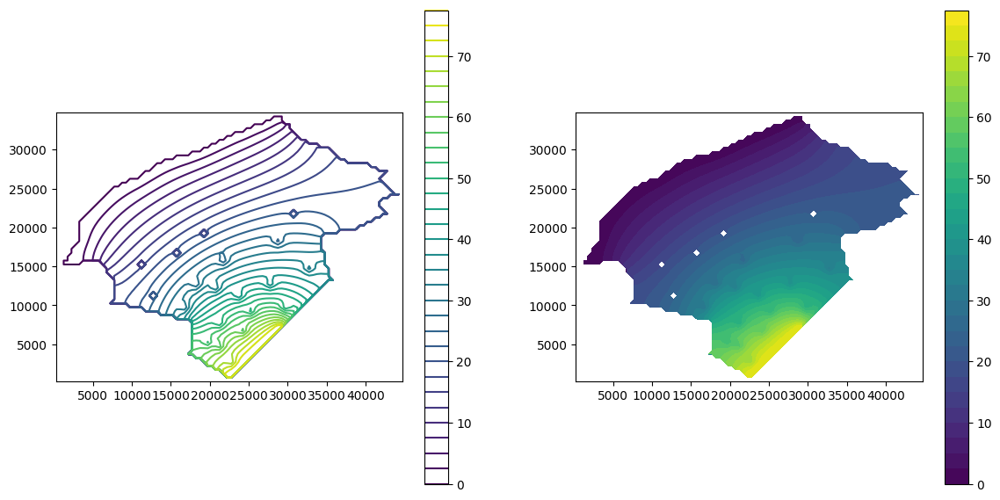

721.0


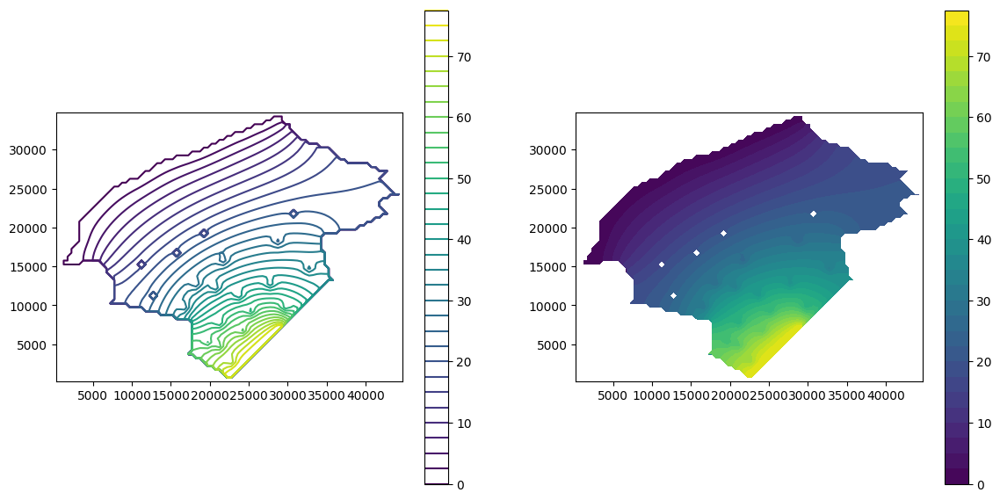

731.0


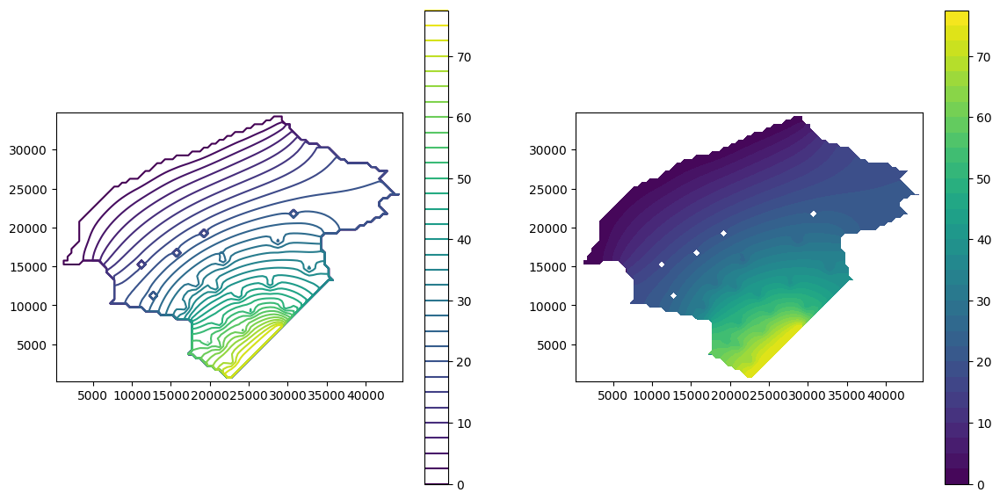

741.0


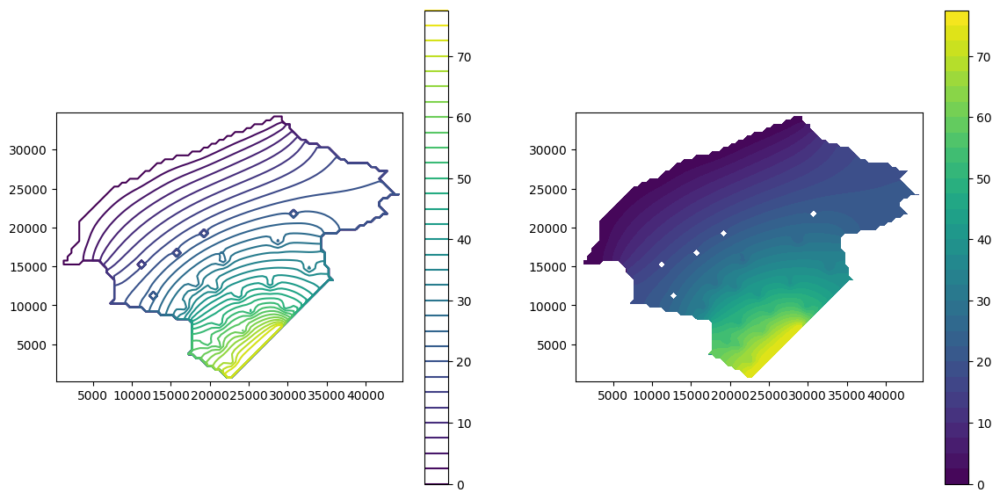

751.0


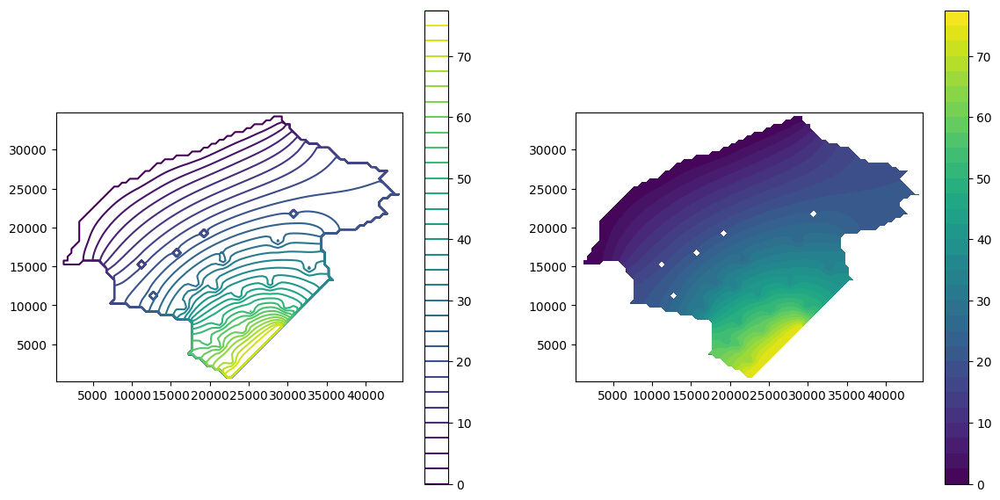

761.0


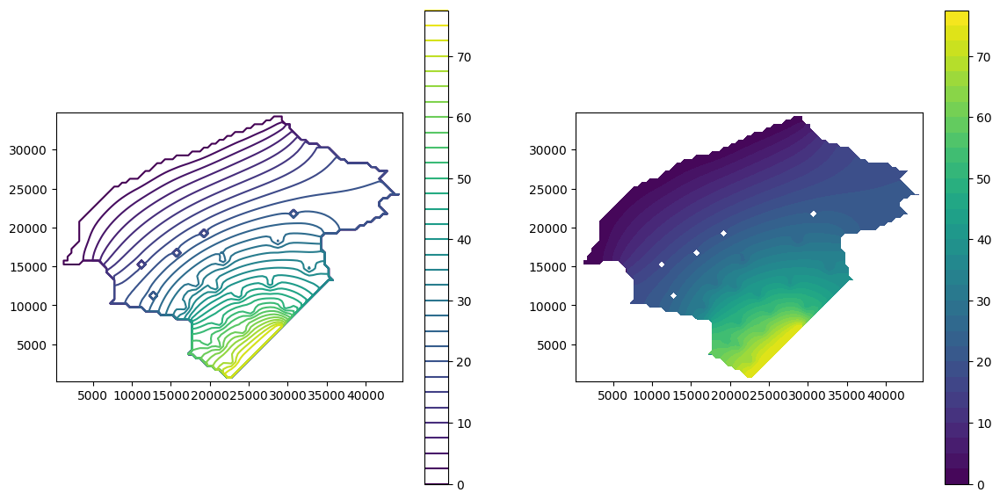

771.0


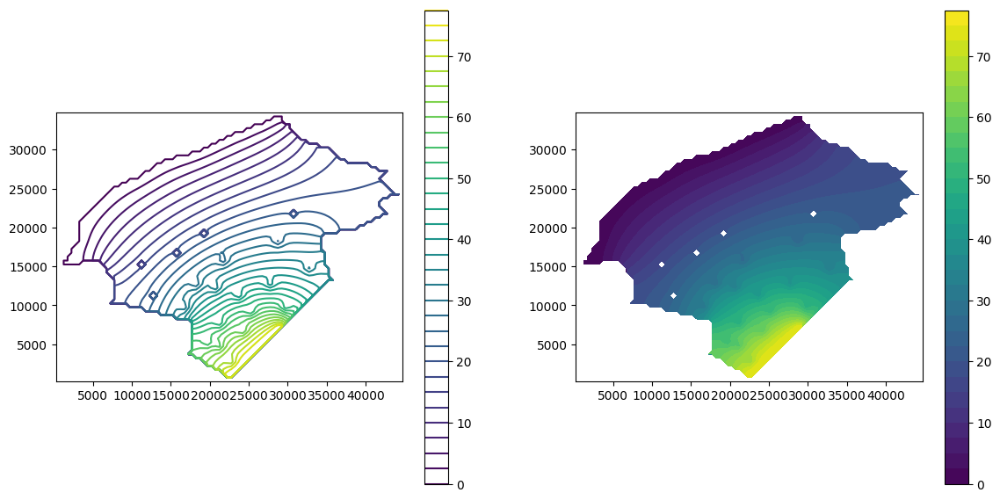

781.0


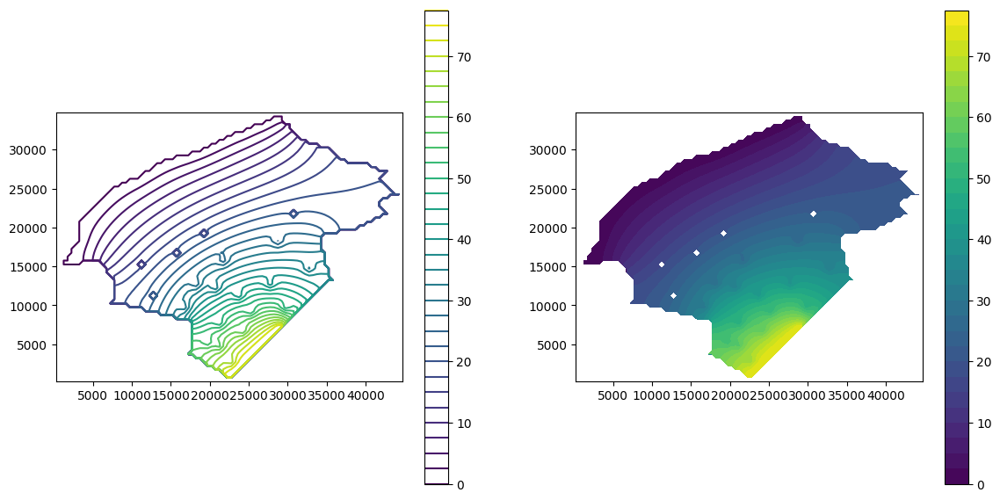

791.0


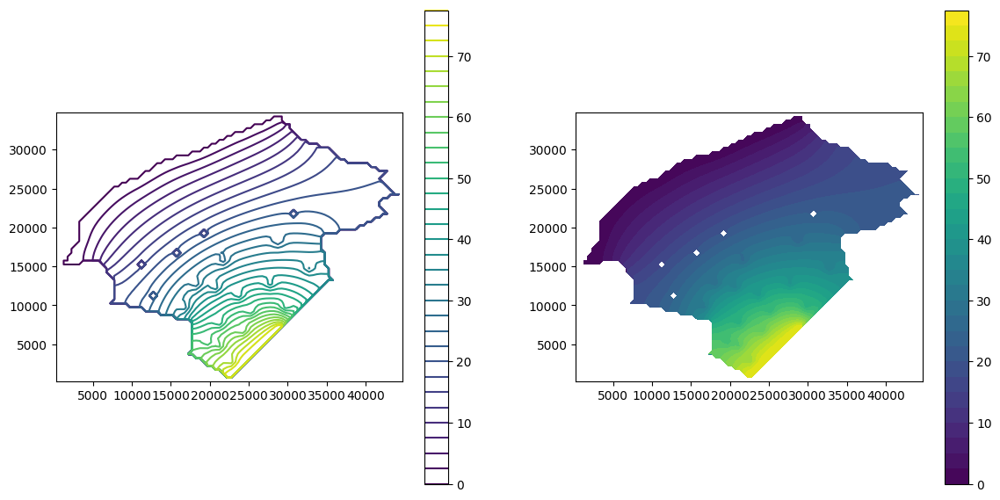

801.0


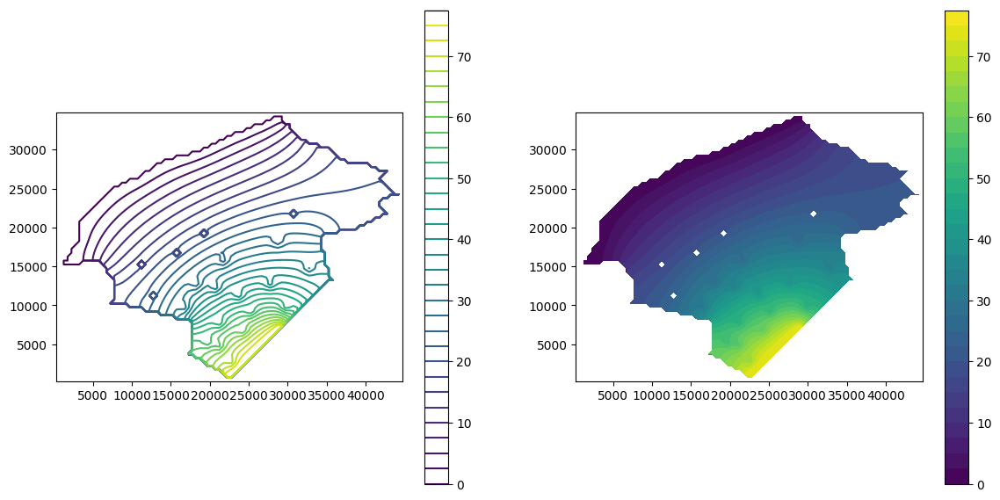

811.0


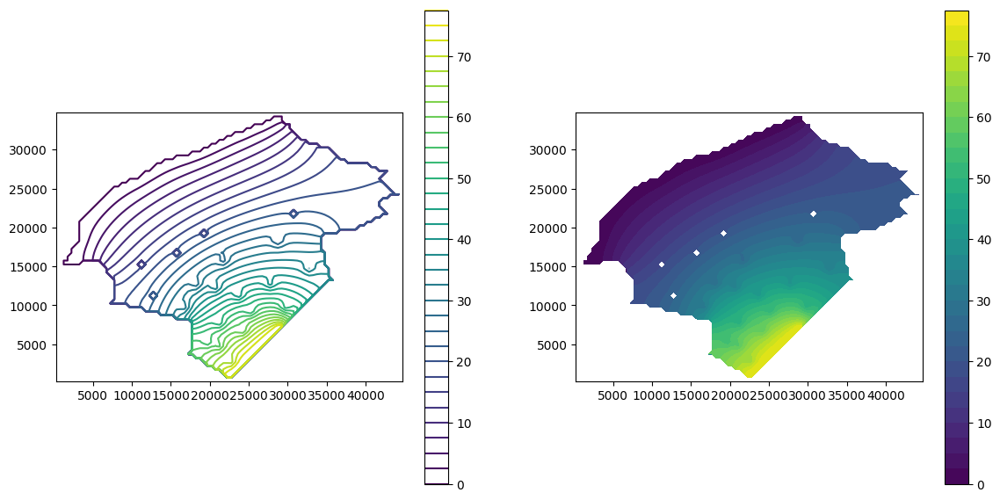

821.0


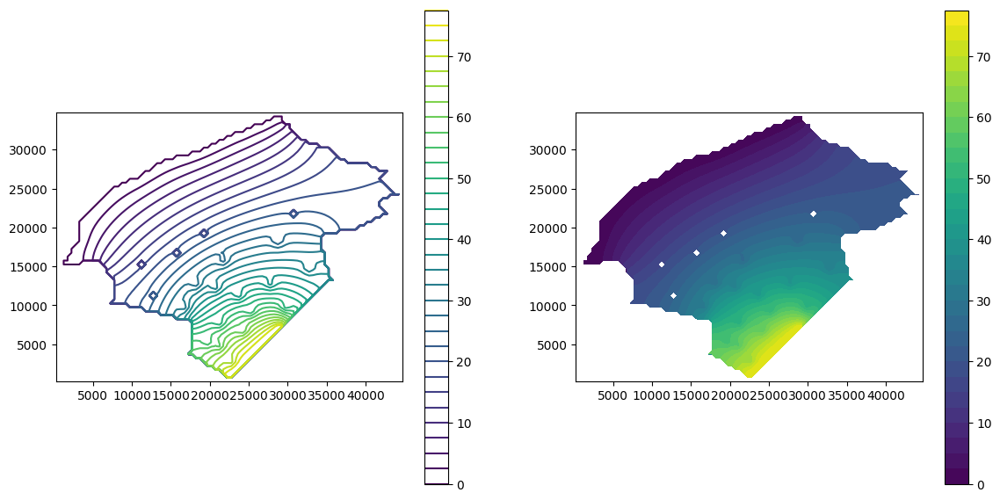

831.0


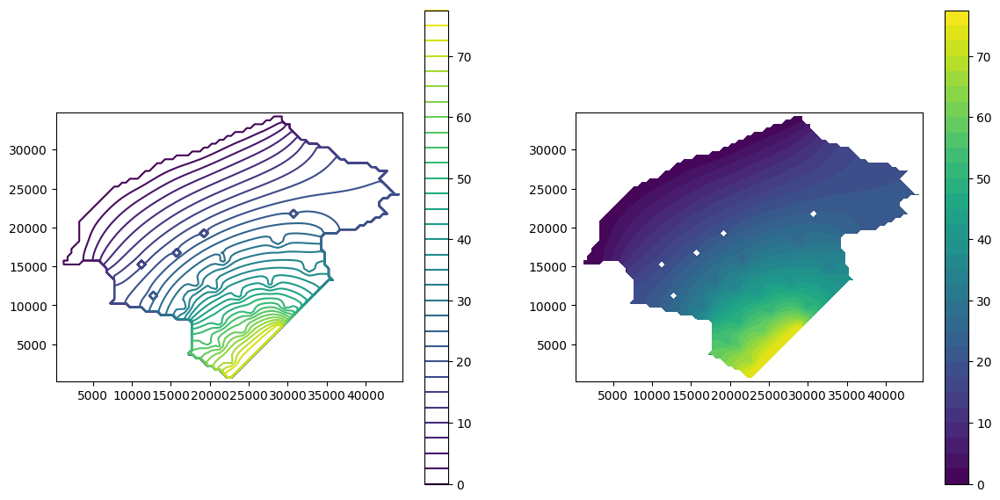

841.0


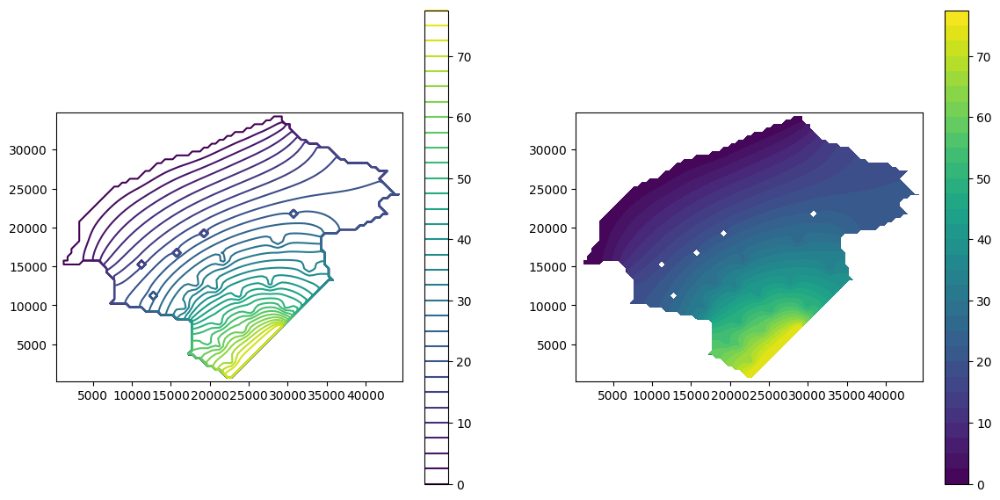

851.0


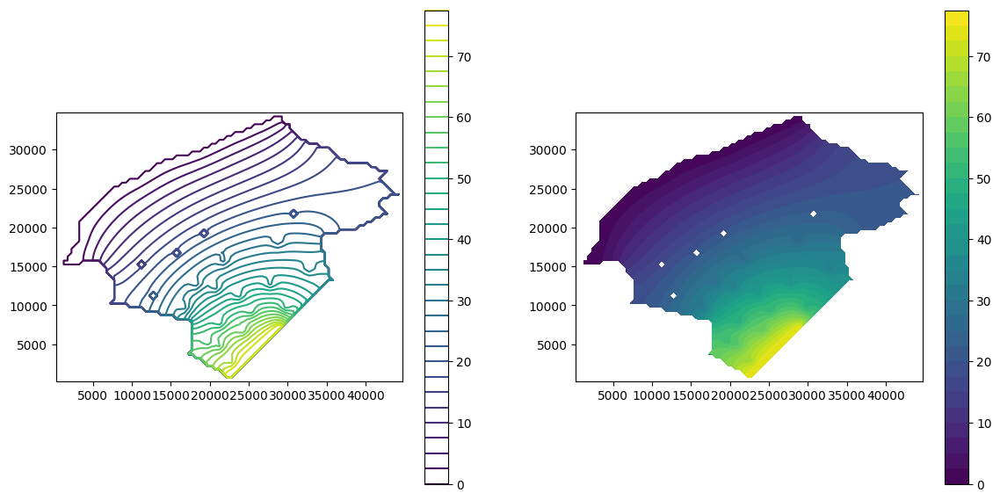

861.0


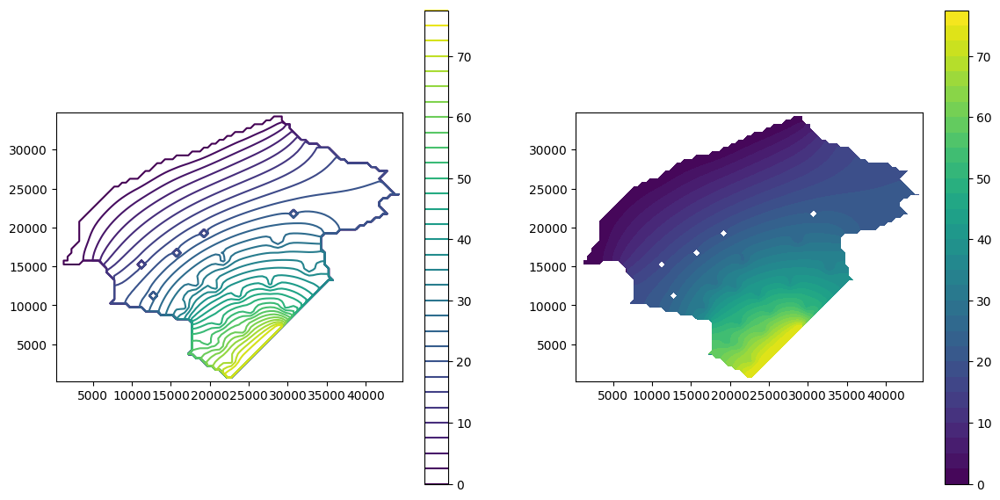

871.0


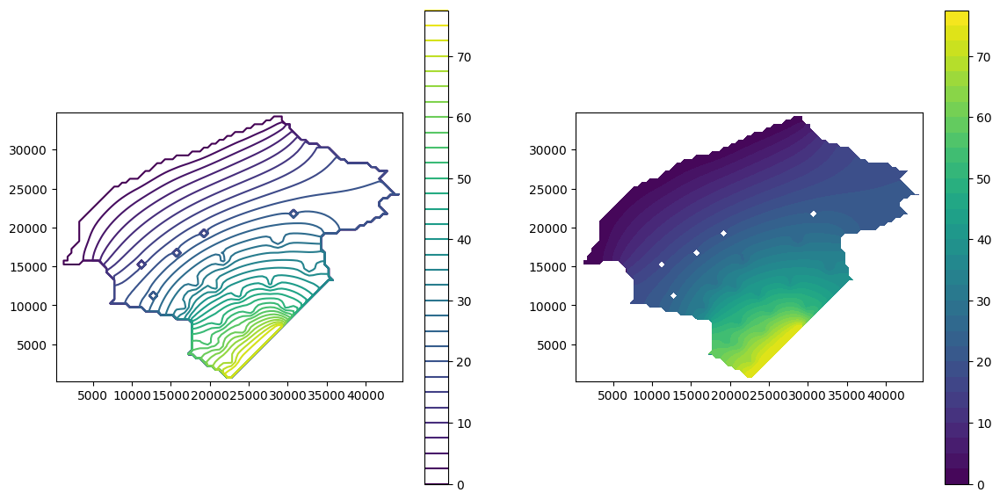

881.0


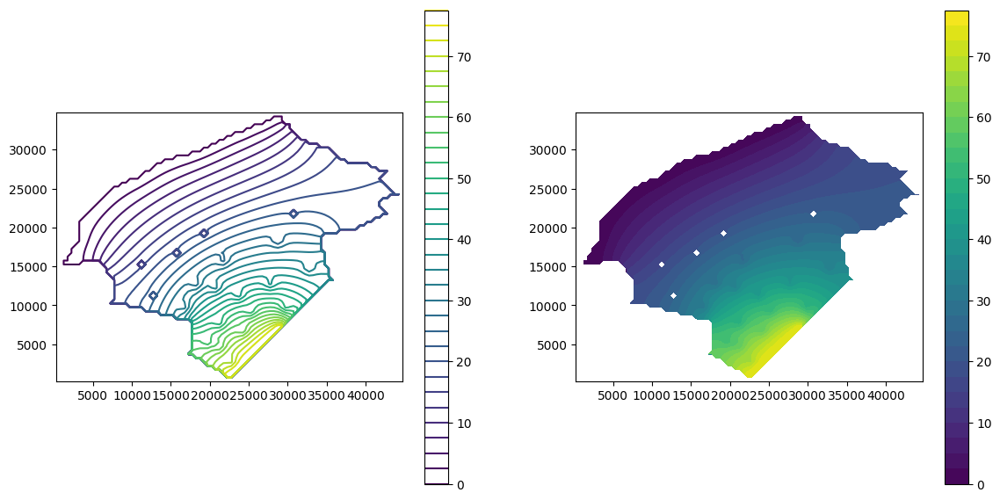

891.0


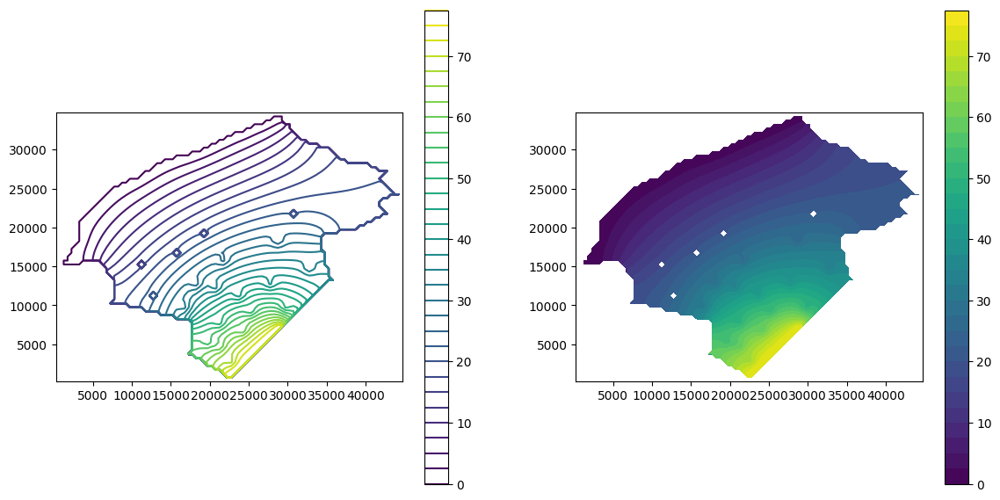

901.0


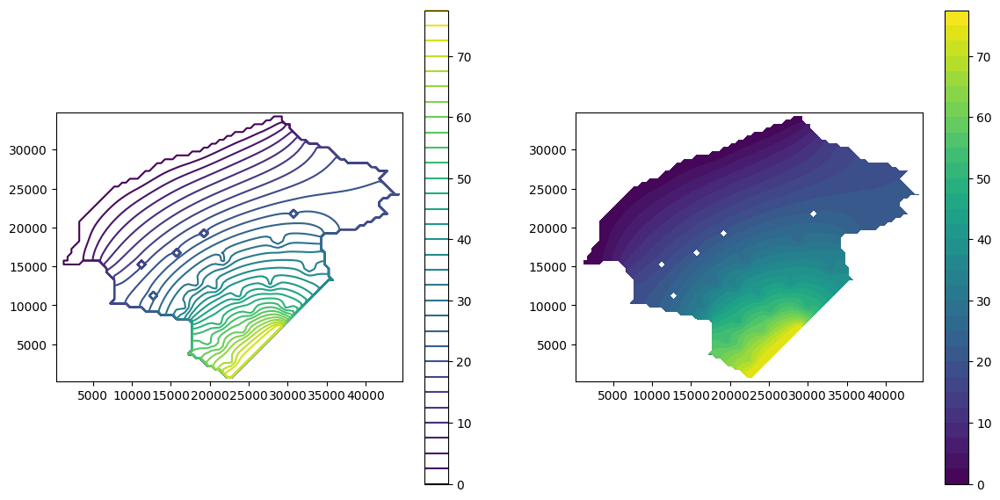

911.0


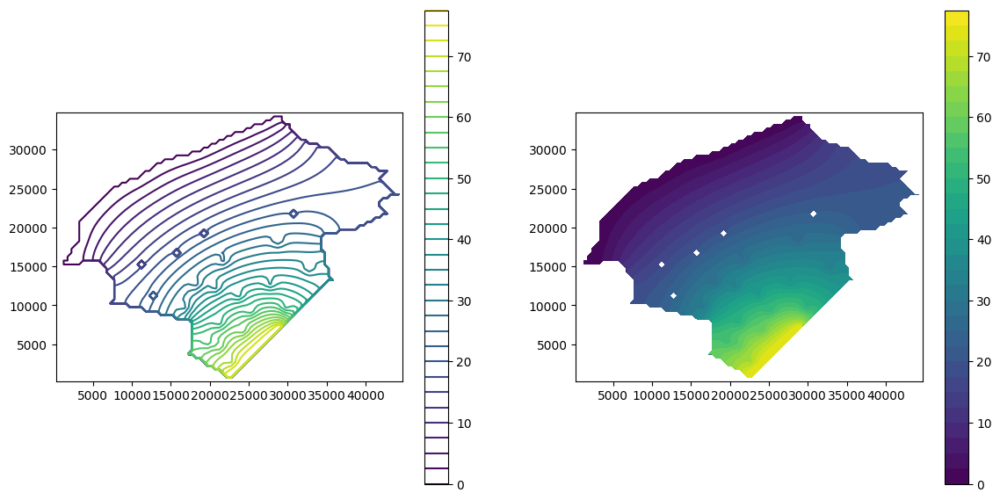

921.0


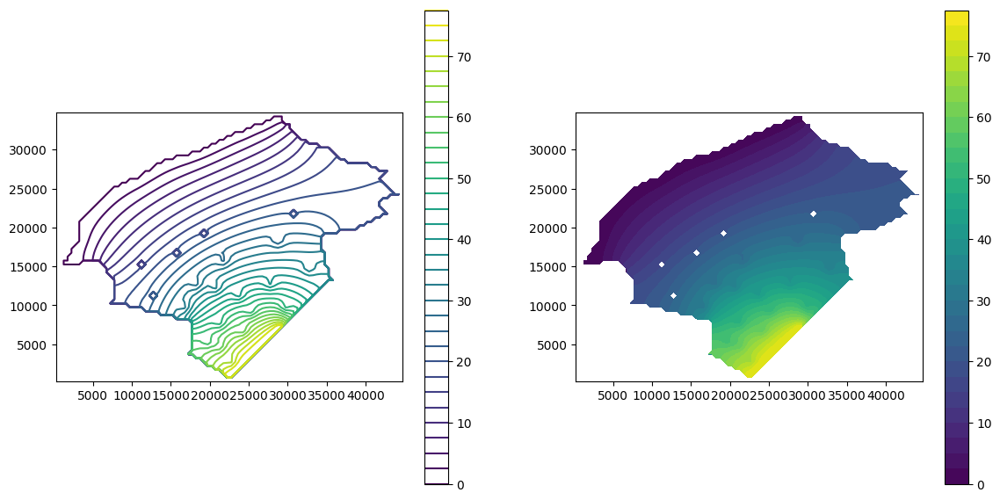

931.0


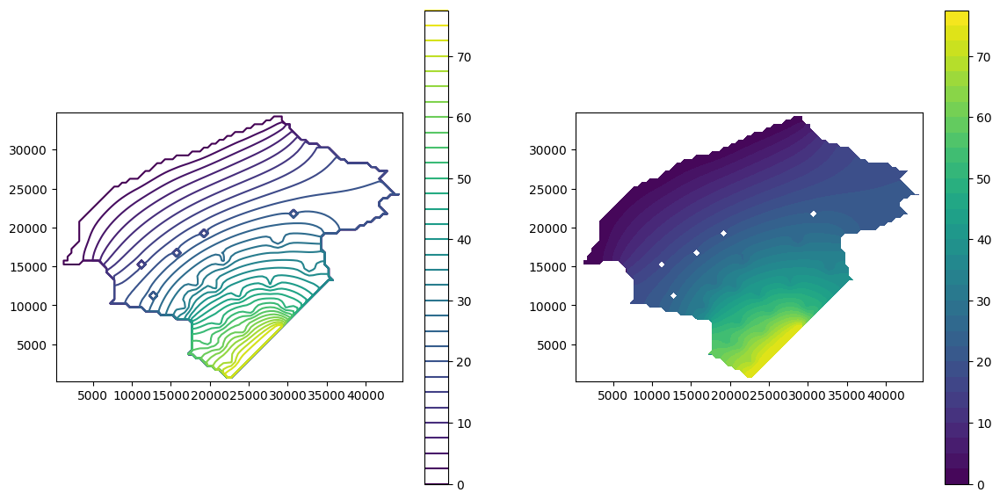

941.0


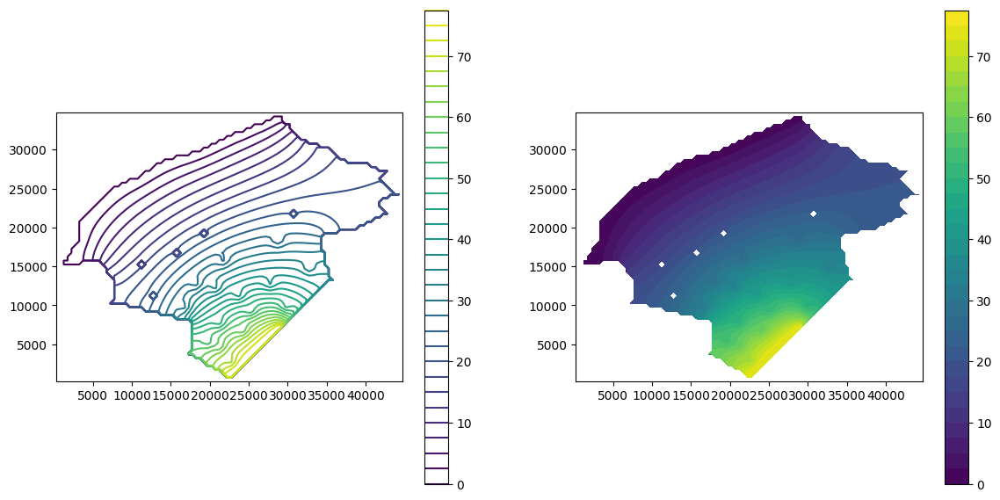

951.0


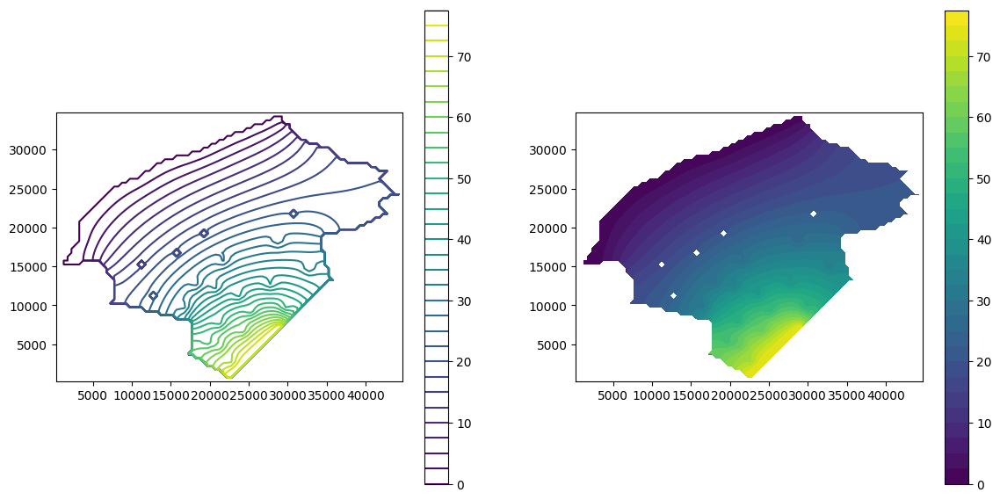

961.0


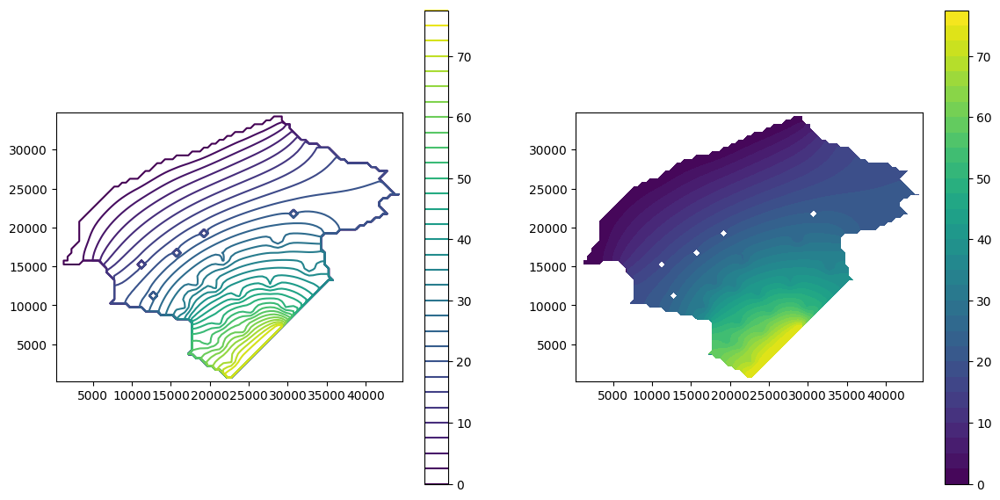

971.0


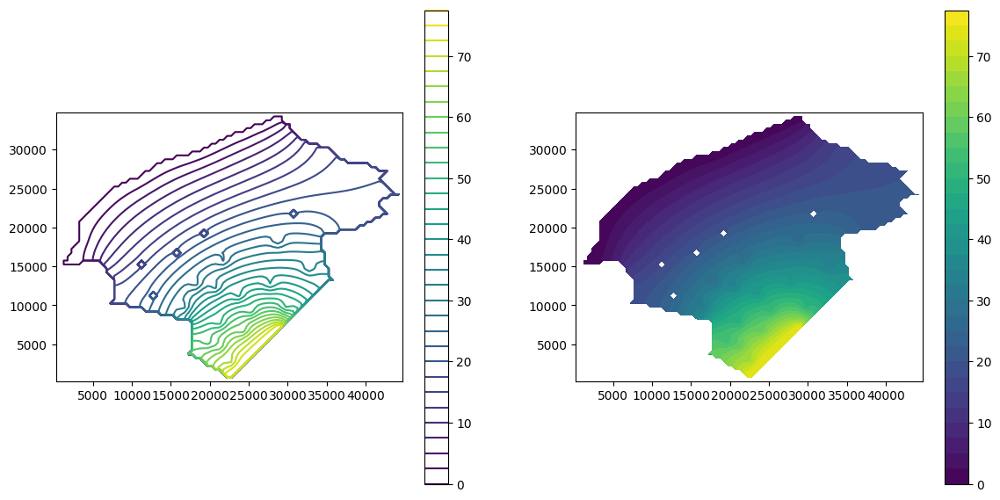

981.0


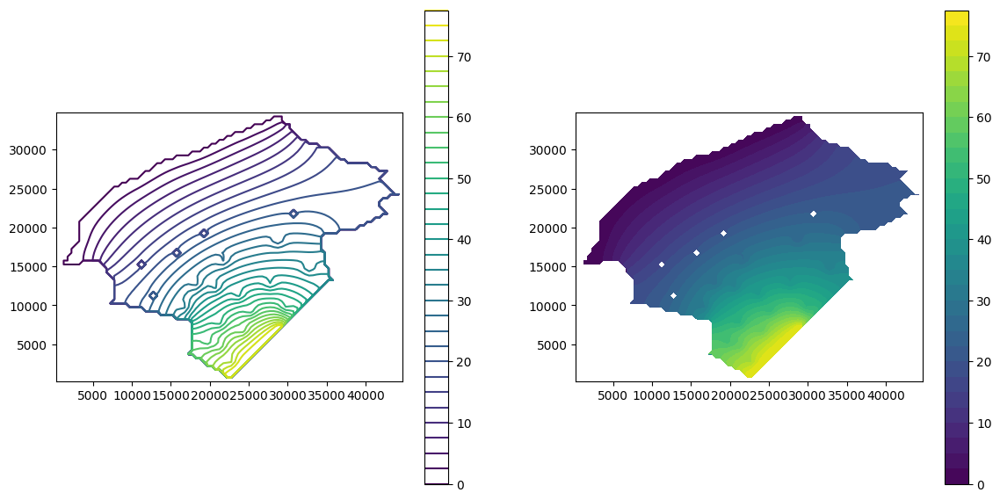

991.0


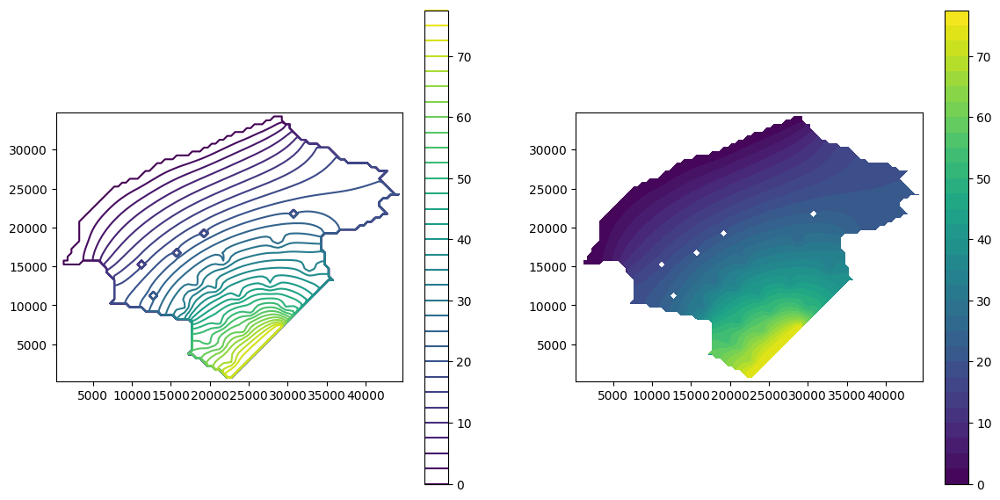

1001.0


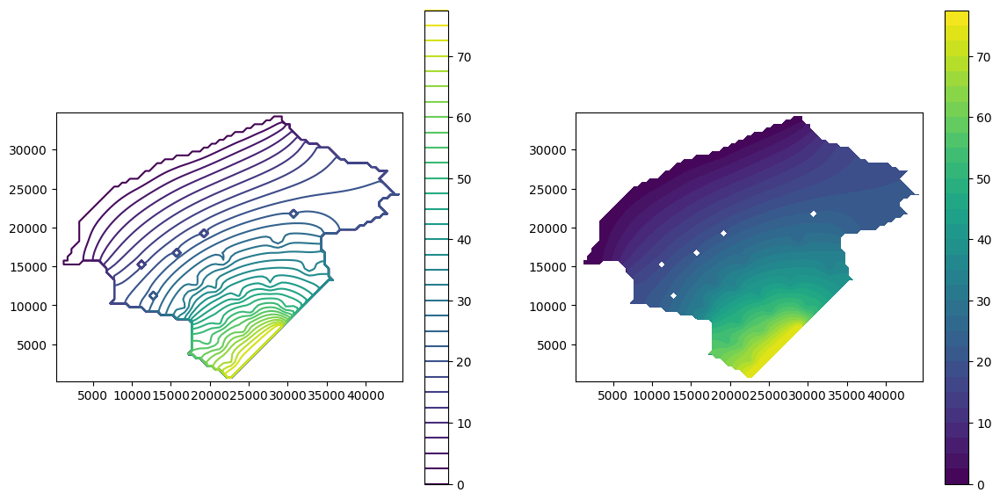

In [15]:
import matplotlib.pyplot as plt
import flopy.utils.binaryfile as bf

hds = bf.HeadFile(modelname+'.hds')
times = hds.get_times()
print(times)


for i in times:
    for j in range(1):
        print(i)
        plt.figure(figsize=(14, 7))
        plt.subplot(1,2,1,aspect='equal')
        head = hds.get_data(totim=i)
        levels = np.arange(0,80,2.5)                             #等高線間隔
        extent = (delr/2.0, Lx-delr/2.0, delc/2.0, Ly-delc/2.0)   #(x0,x1,y0,y1): (x0, y0),(x1, y1)=position of Z[0,0],Z[-1,-1]
        plt.contour(head[j,:,:],  levels=levels, extent=extent)   #等高線圖
        plt.colorbar()

        plt.subplot(1,2,2,aspect='equal')
        head = hds.get_data(totim=i)
        levels = np.arange(0,80,2.5)
        extent = (delr/2.0, Lx-delr/2.0, delc/2.0, Ly-delc/2.0)
        plt.contourf(head[j,:,:],  levels=levels, extent=extent)
        plt.colorbar()
        plt.show()
        


[1.0, 241.0, 481.0, 721.0, 961.0, 1201.0, 1441.0, 1681.0, 1921.0, 2161.0, 2401.0, 2641.0, 2881.0, 3121.0, 3361.0, 3601.0, 3841.0, 4081.0, 4321.0, 4561.0, 4801.0, 5041.0, 5281.0, 5521.0, 5761.0, 6001.0, 6241.0, 6481.0, 6721.0, 6961.0, 7201.0, 7441.0, 7681.0, 7921.0, 8161.0, 8401.0, 8641.0, 8881.0, 9121.0, 9361.0, 9601.0, 9841.0, 10081.0, 10321.0, 10561.0, 10801.0, 11041.0, 11281.0, 11521.0, 11761.0, 12001.0, 12241.0, 12481.0, 12721.0, 12961.0, 13201.0, 13441.0, 13681.0, 13921.0, 14161.0, 14401.0, 14641.0, 14881.0, 15121.0, 15361.0, 15601.0, 15841.0, 16081.0, 16321.0, 16561.0, 16801.0, 17041.0, 17281.0, 17521.0, 17761.0, 18001.0, 18241.0, 18481.0, 18721.0, 18961.0, 19201.0, 19441.0, 19681.0, 19921.0, 20161.0, 20401.0, 20641.0, 20881.0, 21121.0, 21361.0, 21601.0, 21841.0, 22081.0, 22321.0, 22561.0, 22801.0, 23041.0, 23281.0, 23521.0, 23761.0, 24001.0]


c:\users\johnny\appdata\local\programs\python\python39\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (90, 70) and arg 2 with shape (70, 90).

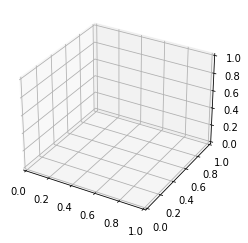

In [199]:
hds = bf.HeadFile(modelname+'.hds')
times = hds.get_times()
print(times)

for i in times:
    for j in range(1):
        x = np.linspace(delr/2, Lx-delr/2, nrow)
        y = np.linspace(delc/2, Ly-delc/2, ncol)
        X,Y = np.meshgrid(x,y)
        head = hds.get_data(totim=i)
        Z = head[j,:,:]
        Z[0,:]=Z[1,:]
        Z[-1,:]=Z[-2,:]
        Z[:,-1]=Z[:,-2]
        
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        p = ax.plot_surface(X,Y,Z, rstride=1, cstride=1,
                    cmap='viridis', edgecolor='none',vmin=0,vmax=75)
        ax.set_zlim(0, 75)
        ax.set_zlabel("h (m)")
        fig.colorbar(p, pad=0.15)

        plt.pause(0.01)
    #break

In [ ]:
import pandas as pd
print(np.shape(head))
df = pd.DataFrame(head[0])
df

In [ ]:
modelname = 'flopy_ex'
mf = flopy.modflow.Modflow(modelname, exe_name='C:/Users/johnny/Downloads/MF2005.1_12/MF2005.1_12/bin/mf2005')

'''
#DIS file
Lx = 10000
Ly = 10000
ztop = 20.0
zbot = -110.0
nlay = 1                                #number of layers
nrow = 100                              #number of rows
ncol = 100                              #number of columns
delr = Lx/ncol                          #cell width along rows
delc = Ly/nrow                          #cell width along columns
delv = (ztop - zbot) / nlay             #cell width along layers
botm = np.linspace(ztop, zbot, nlay+1)  #bottom elevation of a model layer or a Quasi-3d confining bed
'''
nper = 3        # the number of stress periods in the simulation
nstp = [1]*3      # the number of time steps in a stress period.
perlen = [240]*3   # the length of a stress period
steady = [False]*3
itumni = 3       #itumni: indicates the time unit of model data (0:undefined, 1:seconds, 2:minutes, 3:hours, 4:days, 5:years)
                 #lenuni: indicates the length unit of model data (0:undefined, 1:feet, 2:meters, 3:centimeters)

dis = flopy.modflow.ModflowDis(
    mf, nlay, nrow, ncol, delr=delr, delc=delc, top=ztop, botm=botm[1:],
    nper=nper, nstp=nstp, perlen=perlen, itmuni=itumni, steady=False)


#BAS file
ibound = np.ones((nlay, nrow, ncol), dtype=np.int32)   #boundary variable
ibound[:,:,0] = -1
ibound[:,:,-1] = -1
ibound[:,0,:] = 0
ibound[:,-1,:] = 0
strt = hds.get_data(totim=times[-1])   #initial head at the beginning of the simulation
#for i,j in enumerate(np.linspace(100,80,ncol)):
#    strt[:,:,i] = j

Z = head[j,:,:]
Z[0,:]=Z[1,:]
Z[-1,:]=Z[-2,:]
print(i,'   ',Z[50,50],'  ', Z.min())
    
bas = flopy.modflow.ModflowBas(mf, ibound=ibound, strt=strt)


#Layer Property Flow Package
lpf = flopy.modflow.ModflowLpf(mf, laytyp=1, hk=2.16, sy=0.1)   
#hk: hydraulic conductivity, vka: vertical hk


#Well
#stress period:[ layer, row, column, Q(m^3/day)]
Q=-10000
stress_period_data = {0:[[0,50,50,Q],[0,30,30,Q],[0,25,90,Q],[0,75,35,Q],[0,80,80,Q],
                         [0,54,76,Q],[0,15,45,Q],[0,72,57,Q],[0,64,40,Q],[0,50,8,Q]],
                      #2:[[0,50,50,-10],[0,30,30,-10],[0,25,90,-10],[0,80,30,-10],[0,80,80,-10],
                      #   [0,54,76,-10],[0,15,45,-10],[0,72,57,-10],[0,64,40,-10],[0,50,8,-30]],
                      #3:[[0,50,50,0],[0,30,30,0],[0,25,90,0],[0,75,35,0],[0,80,80,0],
                      #   [0,54,76,0],[0,15,45,0],[0,72,57,0],[0,64,40,0],[0,50,8,0]],
                     }
wel = flopy.modflow.ModflowWel(mf, stress_period_data=stress_period_data)


#Output Control
stress_period_data = {}
for kper in range(nper):
    for k in range(10):
        stress_period_data[(kper, k)] = [
            "save head",
            "save drawdown",
            "save budget",
            "print head",
            "print budget",
        ]
oc = flopy.modflow.ModflowOc(
    mf, stress_period_data=stress_period_data
)


#Preconditioned Conjugate-Gradient Solver
pcg = flopy.modflow.ModflowPcg(mf)


# Write the model input files
mf.write_input()
# Run the model
success, buff = mf.run_model()
if not success:
    raise Exception("MODFLOW did not terminate normally.")

In [ ]:
hds = bf.HeadFile(modelname+'.hds')
times = hds.get_times()
print(times)

for i in times:
    for j in range(1):
        print(i)
        plt.subplot(1,2,1,aspect='equal')
        head = hds.get_data(totim=i)
        levels = np.arange(0,101,2.5)                             #等高線間隔
        extent = (delr/2.0, Lx-delr/2.0, delc/2.0, Ly-delc/2.0)   #(x0,x1,y0,y1): (x0, y0),(x1, y1)=position of Z[0,0],Z[-1,-1]
        plt.contour(head[j,:,:],  levels=levels, extent=extent)   #等高線圖

        plt.subplot(1,2,2,aspect='equal')
        head = hds.get_data(totim=i)
        levels = np.arange(0,101,2.5)
        extent = (delr/2.0, Lx-delr/2.0, delc/2.0, Ly-delc/2.0)
        plt.contourf(head[j,:,:],  levels=levels, extent=extent)
        plt.colorbar()
        plt.show()
        


In [ ]:
hds = bf.HeadFile(modelname+'.hds')
times = hds.get_times()
for i in times:
    for j in range(1):
        head = hds.get_data(totim=i)
        Z = head[j,:,:]
        Z[0,:]=Z[1,:]
        Z[-1,:]=Z[-2,:]
        print(i,'   ',Z[50,50],'  ', Z.min())
        

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))

vmin = 0
vmax = 10000

y = np.array([23,14,18,20,17,37,44,40,38,45,62,56,63,60,58,83,75,77,88,70])*100
x = np.array([13,32,41,66,92,30,47,60,72,90,21,36,50,65,82,25,50,63,80,95])*100

y2 = np.array([73,14,18,20,17,37,14,40,38,45,32,50,63,60,58,83,75,77,88,70])*100
x2 = np.array([73,32,41,66,92,30,47,60,72,90,81,50,35,65,82,95,40,63,80,95])*100

ax.set_xlim(vmin, vmax)
ax.set_ylim(vmin, vmax)
ax.set_xticks([vmin,vmax])
ax.set_yticks([vmin,vmax])
ax.scatter(x2, y2, s=100, marker='o',facecolors='none', edgecolors='black', linewidth=1.5)

plt.show()